In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import pathlib
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from matplotlib.lines import Line2D
import matplotlib as mpl
from itertools import cycle


# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/outgoing'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        file = os.path.join(dirname, filename)

print(file)
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

ModuleNotFoundError: No module named 'sklearn'

In [3]:
df['holiday'] = df.apply(lambda row: holiday_func(row), axis=1)

Data loading complete!


In [4]:
from datetime import date
import datetime
import holidays

def holiday_func(row):
    if row['Date'] in holidays.country_holidays('GR'):
        return True
    else:
        return False
    
    
def weekday_func(row):
    return row['Date'].weekday()

    

In [5]:
df['holiday'] = df.apply(lambda row: holiday_func(row), axis=1)
    

In [6]:
df['weekday'] = df.apply(lambda row: weekday_func(row), axis=1)

In [7]:
df

,Date,Kwh,year,month,day,city,holiday,weekday
0,2008-01-01,0.000000e+00,2008,1,1,AGIOI THEODOROI,True,1
25,2008-01-01,0.000000e+00,2008,1,1,KARDITSA,True,1
26,2008-01-01,2.203870e+03,2008,1,1,KATERINI,True,1
27,2008-01-01,5.083301e+04,2008,1,1,KILKIS,True,1
28,2008-01-01,2.407438e+05,2008,1,1,KOKKINA,True,1
...,...,...,...,...,...,...,...,...
241037,2022-08-31,1.240000e+02,2022,8,31,ELPE HAR,False,2
241038,2022-08-31,4.910000e+02,2022,8,31,ENERGIAKI THESS. (ELPE),False,2
241039,2022-08-31,1.734886e+07,2022,8,31,HERON II,False,2
241029,2022-08-31,1.651669e+07,2022,8,31,ALIVERI (PPC),False,2


In [8]:
outcome = df.copy()

In [9]:
outcome

,Date,Kwh,year,month,day,city,holiday,weekday
0,2008-01-01,0.000000e+00,2008,1,1,AGIOI THEODOROI,True,1
25,2008-01-01,0.000000e+00,2008,1,1,KARDITSA,True,1
26,2008-01-01,2.203870e+03,2008,1,1,KATERINI,True,1
27,2008-01-01,5.083301e+04,2008,1,1,KILKIS,True,1
28,2008-01-01,2.407438e+05,2008,1,1,KOKKINA,True,1
...,...,...,...,...,...,...,...,...
241037,2022-08-31,1.240000e+02,2022,8,31,ELPE HAR,False,2
241038,2022-08-31,4.910000e+02,2022,8,31,ENERGIAKI THESS. (ELPE),False,2
241039,2022-08-31,1.734886e+07,2022,8,31,HERON II,False,2
241029,2022-08-31,1.651669e+07,2022,8,31,ALIVERI (PPC),False,2


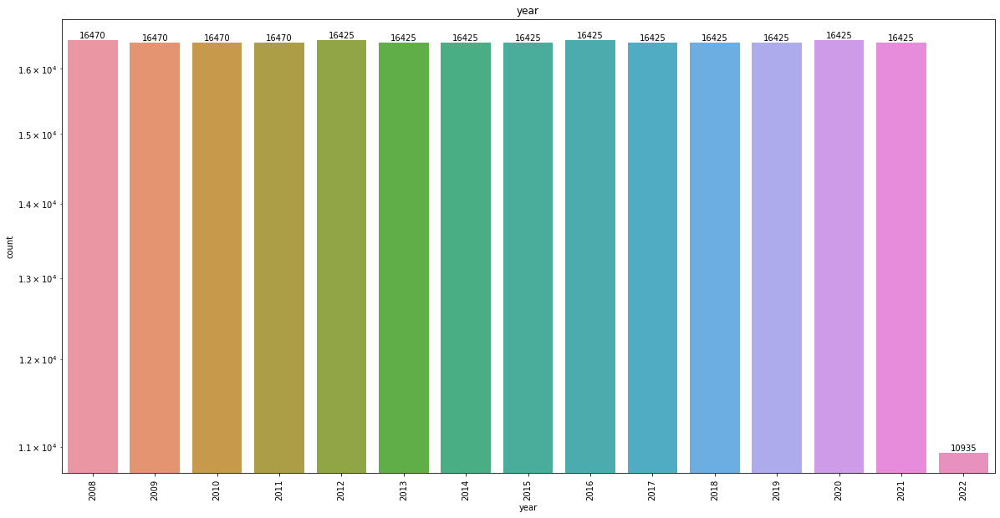

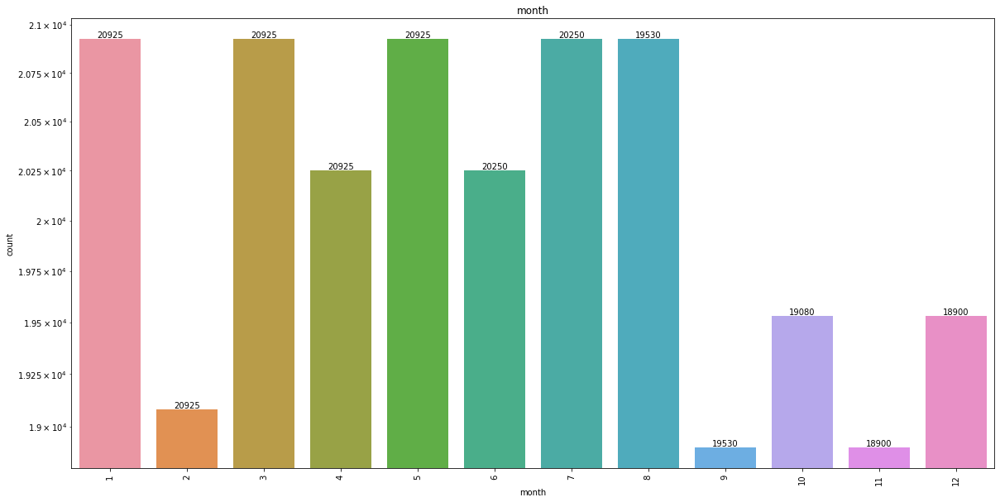

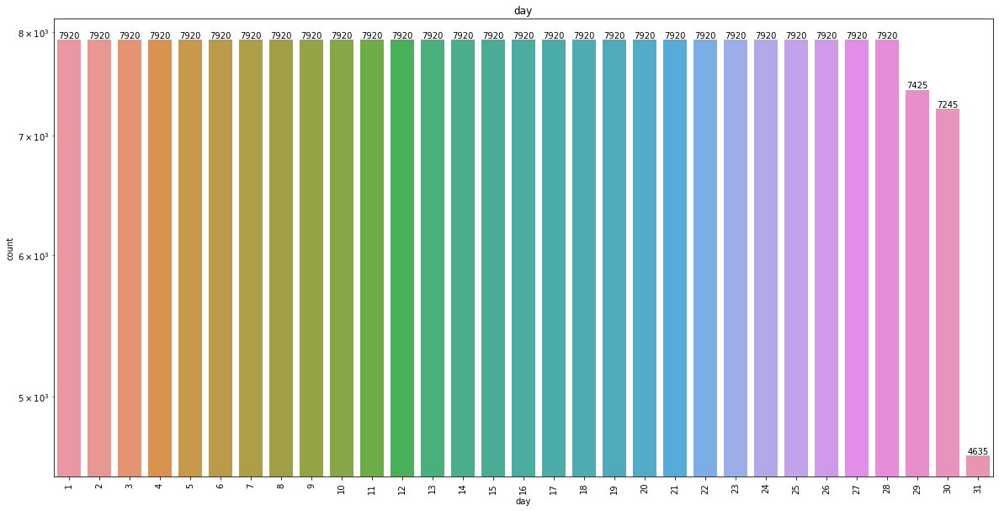

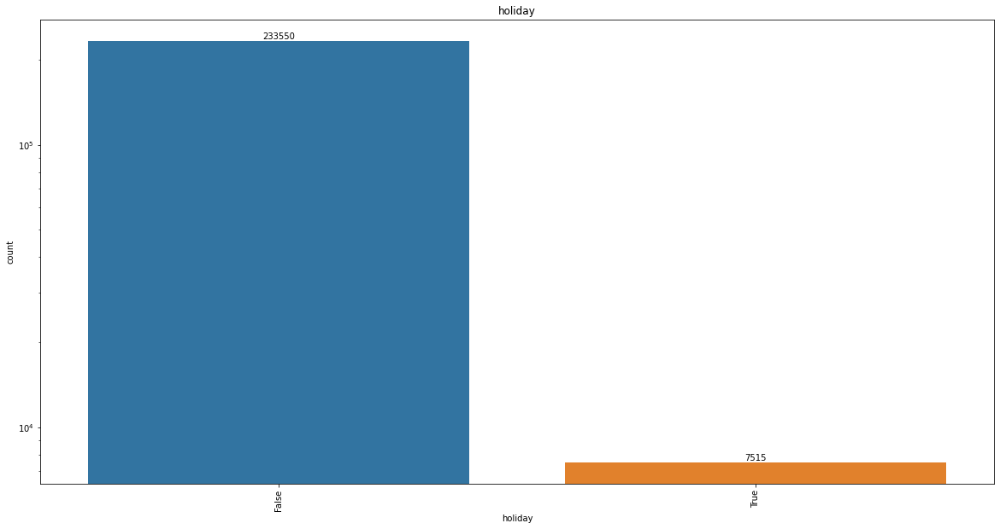

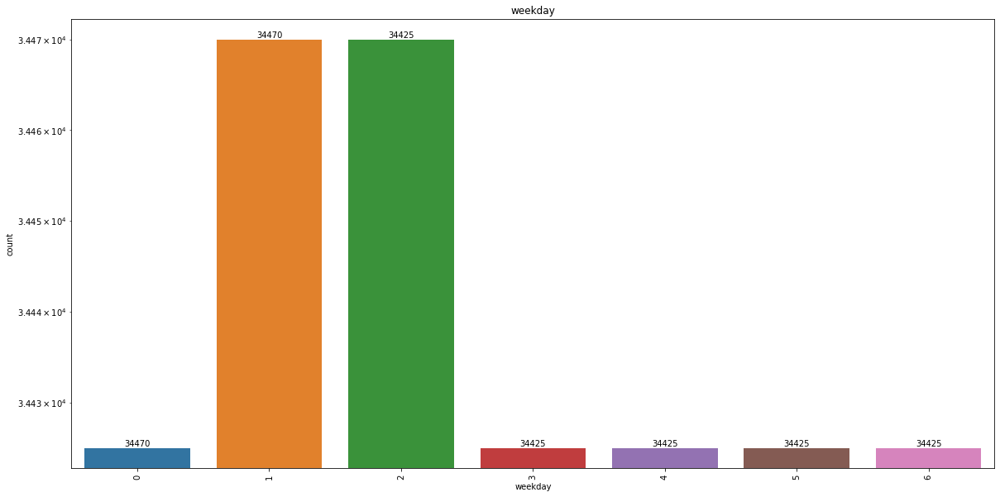

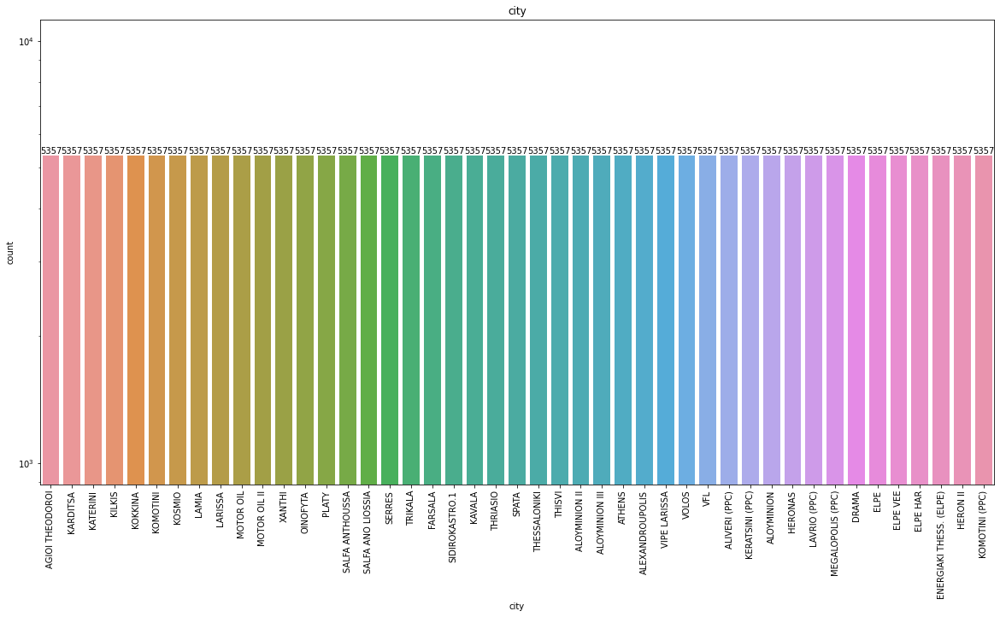

In [10]:
def create_barplots(pd):
    for col in ['year','month', 'day', 'holiday','weekday', 'city']:
        """
        This function creates a countplot for each of datetime_parameters we want in the x-axis
        Parameters: None
        ----------
        Returns: None
        -------
        """
        fig, ax = plt.subplots()
        fig.set_size_inches(20, 10)
        ax = sns.countplot(x=pd[col])
        ax.set_yscale('log')
        abs_values = pd[col].value_counts(ascending=False).values

        ax.bar_label(ax.containers[0], labels=abs_values,rotation=0)
        plt.title(col)
        plt.xticks(x=abs_values, rotation=90)
        plt.show()

create_barplots(outcome)

In [ ]:
#convert datetime to isfinite float number
def convert_datetime_to_number(df):
    """
    This function converts the datetime column to a float number
    Parameters: None
    ----------
    Returns: None
    -------
    """
    df['Date'] = df['Date'].apply(lambda x: x.timestamp())
    return df

In [ ]:
#predict next year Kwh consumption 
def predict_next_year(df):
    """
    This function predicts the next year Kwh consumption
    Parameters: None
    ----------
    Returns: None
    -------
    """
    #split the data into train and test
    train = df[:int(0.8*(len(df)))]
    test = df[int(0.8*(len(df))):]
    #train the model
    # import ARIMA model from statsmodels
    import statsmodels.api as smapi
    # fit model

    model = smapi.tsa.arima.ARIMA(train['Kwh'], order=(5,1,0))
    model_fit = model.fit(disp=0)
    #make predictions
    start_index = len(train)
    end_index = len(train) + len(test) - 1
    predictions = model_fit.predict(start=start_index, end=end_index, dynamic=False, typ='levels').rename("Predictions")
    #plot the predictions for test set
    predictions.plot(legend=True)
    test['Kwh'].plot(legend=True)
    plt.show()
    #calculate the rmse
    rmse = np.sqrt(mean_squared_error(test['Kwh'], predictions))
    print(rmse)
    #predict the next year
    model = ARIMA(df['Kwh'], order=(5,1,0))
    model_fit = model.fit(disp=0)
    start_index = len(df)
    end_index = len(df) + 365
    predictions = model_fit.predict(start=start_index, end=end_index, dynamic=False, typ='levels').rename("Predictions")
    #plot the predictions for the next year
    predictions.plot(legend=True)
    df['Kwh'].plot(legend=True)
    plt.show()
    #print this year Kwh consumption
    print('This year Kwh consumption is: ', df['Kwh'].sum())
    return predictions

: 

In [ ]:
#show the average Kwh consumption per day on weekday 6 and 7
def show_weekend_average_kwh(df):
    """
    This function shows the average Kwh consumption per day on weekday 6 and 7
    Parameters: None
    ----------
    Returns: None
    -------
    """
    df['weekday'] = df['Date'].apply(lambda x: x.weekday())
    df['weekday'] = df['weekday'].apply(lambda x: 1 if x == 6 or x == 7 else 0)
    df = df[df['weekday'] == 1]
    df = df.groupby('Date')['Kwh'].mean()
    df.plot()
    plt.show()    


In [ ]:
#barpot the average Kwh consumption per year and explain each line of code
def show_average_kwh_per_year(df):
    """
    This function shows the average Kwh consumption per year
    Parameters: None
    ----------
    Returns: None
    -------
    """
    df['year'] = df['Date'].apply(lambda x: x.year) #create a new column with the year
    df = df.groupby('year')['Kwh'].mean() #group by year and calculate the mean
    df.plot() #plot the data
    plt.show() #show the plot    


In [ ]:
#barplot the averages difference of Kwh per month for all cities for income and outcome data

def plot_avg_per_month_kwh_diff(df1, df2):
    """
    This function barplots the averages difference of Kwh per month for all cities for income and outcome data
    Parameters: None
    ----------
    Returns: None
    -------
    """
    #get the average per month for each city
    df1 = df1.groupby(['month']).mean()
    df2 = df2.groupby(['month']).mean()
    #plot the data
    fig, ax = plt.subplots()
    fig.set_size_inches(20, 10)
    ax = sns.barplot(x=df1.index, y=df1['Kwh'] - df2['Kwh'])
    plt.title('Difference of average Kwh per month for all cities')
    plt.show()



In [ ]:
#cluster cities in dendogram based on Kwh, drop datetime parameters 
def cluster_cities_dendogram(df):
    """
    This function clusters cities in dendogram based on Kwh, drop datetime parameters 
    Parameters: None
    ----------
    Returns: None
    -------
    """
    #drop datetime parameters
    df = df.drop(columns=['year', 'month', 'day', 'weekday', 'holiday'])
    #group by city
    df = df.groupby(['city']).mean()
    #create dendogram
    fig, ax = plt.subplots()
    fig.set_size_inches(20, 10)
    ax = sns.clustermap(df, cmap='coolwarm', annot=True)
    plt.title('Clustermap of cities based on Kwh')
    plt.show()


    


In [ ]:
#create a subdataframe which only contains row that the city has the string '(PPC)' or "HERONAS" or "HERON II" 
def create_subdataframe(df):
    """
    This function creates a subdataframe which only contains row that the city has the string '(PPC)' or "HERONAS" or "HERON II" 
    Parameters: None
    ----------
    Returns: None
    -------
    """
    #create a subdataframe which only contains row that the city has the string '(PPC)' or "HERONAS" or "HERON II" 
    df = df[df['city'].str.contains(?:'(PPC)|HERONAS|HERON II')]
    return df




In [ ]:
#create a subdataframe which only contains row that the city has the string
#  "ATHENS", "LARISSA", "THESSALONIKI", "SERRES", "KAVALA", "VOLOS", "DRAMA", "ALEXANDROUPOLIS", "XANTHI", "LAMIA","KATERINI", "KARDITSA","KILKIS", "TRIKALA"
#   SIDIROKASTRO, OINOFYTA, SERRES, FARSALA, KOSMIO, "AGIOI THEODOROI", KAVALA, THSIVI,VOLOS,DRAMA,SPATA, KOKKINA, KOMMOTINI


In [ ]:
# create a subdataframe which only contains row that the city has the name o greek city
def create_subdataframe_greek_cities(df):
    """
    This function creates a subdataframe which only contains row that the city has the name o greek city
    Parameters: None
    ----------
    Returns: None
    -------
    """
    #create a subdataframe which only contains row that the city has the name o greek city
    df = df[df['city'].str.contains("ATHENS|LARISSA|THESSALONIKI|SERRES|KAVALA|VOLOS|DRAMA|ALEXANDROUPOLIS|XANTHI|LAMIA|KATERINI|KARDITSA|KILKIS|TRIKALA|SIDIROKASTRO|OINOFYTA|SERRES|FARSALA|KOSMIO|AGIOI THEODOROI|KAVALA|THIsVI|VOLOS|DRAMA|SPATA|KOKKINA|KOMMOTINI")]
    #drop all rows of city "VIPE LARISSA"
    df = df[df['city'] != 'VIPE LARISSA']
    return df


In [ ]:
#group cities name in two geo groups based on information from the internet
def group_cities(df):
    """
    This function groups cities name in two geo groups based on information from the internet
    Parameters: None
    ----------
    Returns: None
    -------
    """
    #group cities name in two geo groups based on information from the internet
    df['geo_group'] = df['city'].apply(lambda x: 'north' if x in ["SIDIROKASTRO 1","LARISSA", "THESSALONIKI", "SERRES", "KAVALA", "VOLOS", "DRAMA", "ALEXANDROUPOLIS", "XANTHI", "LAMIA","KATERINI", "KARDITSA","KILKIS", "TRIKALA", "KOMMOTINI"] else 'south')
    
    return df






    


In [ ]:
#multiple plots for comparing of the two biggeest cities in each geo group
def plot_multiple(df):
    """
    This function multiple plots for comparing of the two biggeest cities in each geo group
    Parameters: None
    ----------
    Returns: None
    -------
    """
    #create a subdataframe for the two biggest cities in each geo group
    df = df[df['city'].str.contains("THESSALONIKI|ATHENS|LARISSA|SERRES|KAVALA|VOLOS|DRAMA|ALEXANDROUPOLIS|XANTHI|LAMIA|KATERINI|KARDITSA|KILKIS|TRIKALA|SIDIROKASTRO|OINOFYTA|SERRES|FARSALA|KOSMIO|AGIOI THEODOROI|KAVALA|THIsVI|VOLOS|DRAMA|SPATA|KOKKINA|KOMMOTINI")]
    df = df[df['city'] != 'VIPE LARISSA']
    df = df[df['city'].str.contains("THESSALONIKI|ATHENS")]
    df = df.groupby(['city', 'year', 'month']).mean()
    df = df.reset_index()
    #plot the data
    fig, ax = plt.subplots()
    fig.set_size_inches(20, 10)
    ax = sns.lineplot(x='month', y='Kwh', hue='city', data=df)
    plt.title('Kwh per month for the two biggest cities in each geo group')
    plt.show()

In [ ]:
#plot to compare the daily consumption of weekdays compared to weekends in all cities
def plot_weekdays_weekends(df):
    """
    This function plot to compare the daily consumption of weekdays compared to weekends in all cities
    Parameters: None
    ----------
    Returns: None
    -------
    """
    df = df.groupby(['city', 'weekday']).mean()
    df = df.reset_index()
    #plot the data
    fig, ax = plt.subplots()
    fig.set_size_inches(20, 10)
    ax = sns.barplot(x='weekday', y='Kwh', hue='city', data=df)
    plt.title('Kwh per weekday for all cities')
    plt.show()

In [ ]:
#compare average Kwh per day of all cities in weekdays and weekends and plot the data
def plot_weekdays_weekends_average(df):
    """
    This function compare average Kwh per day of all cities in weekdays and weekends and plot the data
    Parameters: None
    ----------
    Returns: None
    -------
    """
    df = df.groupby(['weekday']).mean()
    df = df.reset_index()
    #plot the data
    fig, ax = plt.subplots()
    fig.set_size_inches(20, 10)
    ax = sns.barplot(x='weekday', y='Kwh', data=df)
    plt.title('Kwh per weekday for all cities')
    plt.show()



In [ ]:
#barplot the ATHENS and THESSALONIKI percentage of the total consumption of all cities
def plot_barplot(df):
    """
    This function barplot the ATHENS and THESSALONIKI percentage of the total consumption of all cities
    Parameters: None
    ----------
    Returns: None
    -------
    """
    df = df.groupby(['city']).sum()
    df = df.reset_index()
    df = df[df['city'].str.contains("THESSALONIKI|ATHENS")]
    df['percentage'] = df['Kwh']/df['Kwh'].sum()
    #plot the data
    fig, ax = plt.subplots()
    fig.set_size_inches(20, 10)
    #barplot athens fisrt and then thessaloniki
    df = df.sort_values(by=['percentage'], ascending=False)
    #print each percentage on title of the bar
    for i, v in enumerate(df['percentage']):
        ax.text(i, v, str(round(v*100, 2)) + '%', color='blue', fontweight='bold')
    ax = sns.barplot(x='city', y='percentage', data=df)
    plt.title('Percentage of the total consumption of all cities')
    plt.show()
    


In [ ]:
#print south cities
def print_south_cities(df):
    """
    This function prints south cities
    Parameters: None
    ----------
    Returns: None
    -------
    """
    #print south cities
    print(df[df['geo_group'] == 'south']['city'].unique())

In [ ]:
#mean_kwh_per_month of the cities in the north and south
def mean_kwh_per_month(df):
    """
    This function barplots the mean_kwh_per_month of the cities in the north and south
    Parameters: None
    ----------
    Returns: None
    -------
    """
    #mean_kwh_per_month of the cities in the north and south
    df = df.groupby(['geo_group', 'month']).mean()
    df = df.reset_index()
    fig, ax = plt.subplots()
    fig.set_size_inches(20, 10)
    ax = sns.barplot(x='month', y='Kwh', hue='geo_group', data=df)
    plt.title('Mean Kwh per month for cities in the north and south')
    plt.show()
    


In [ ]:
# create dataframe with the cities "ATHENS", "LARISSA", "THESSALONIKI", "SERRES", "KAVALA", "VOLOS", "DRAMA", "ALEXANDROUPOLIS", "XANTHI", "LAMIA","KATERINI", "KARDITSA","KILKIS", "TRIKALA"
# and the years 2008-2022
df = pd.DataFrame() 
for city in ["ATHENS", "LARISSA", "THESSALONIKI", "SERRES", "KAVALA", "VOLOS", "DRAMA", "ALEXANDROUPOLIS", "XANTHI", "LAMIA","KATERINI", "KARDITSA","KILKIS", "TRIKALA"]:
    for year in range(2008,2023):
        for month in range(1,13):
            for day in range(1,32):
                df = df.append({'city': city, 'year': year, 'month': month, 'day': day}, ignore_index=True)
df['Date'] = pd.to_datetime(df[['year', 'month', 'day']])
df['holiday'] = df.apply(lambda row: holiday_func(row), axis=1)

df['weekday'] = df.apply(lambda row: weekday_func(row), axis=1)

df













    





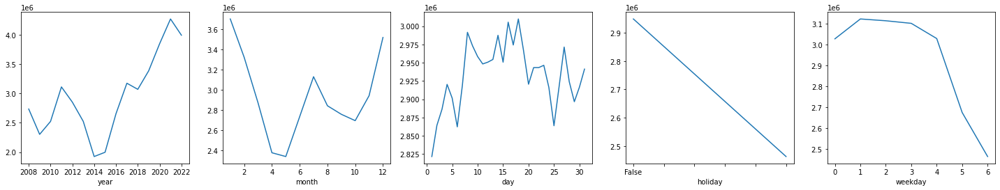

In [11]:

def load_meanplot(pd):
    """
    This function is used to plot the mean energy load per "datatime aspect" (year/month/hour etc)
    Parameters: 
            Dataframe for plotting
    ----------
    Returns: None
    -------
    """
    fig, axes = plt.subplots(1, 5) // 5     
    pd.groupby('year')['Kwh'].mean().plot(ax=axes[0], figsize=(25, 3))
    pd.groupby('month')['Kwh'].mean().plot(ax=axes[1], figsize=(25, 3))
    pd.groupby('day')['Kwh'].mean().plot(ax=axes[2], figsize=(25, 4))
    pd.groupby('holiday')['Kwh'].mean().plot(ax=axes[3], figsize=(25, 4)) # we can see that the mean energy load is higher on holidays
    pd.groupby('weekday')['Kwh'].mean().plot(ax=axes[4], figsize=(25, 4)) 
load_meanplot(outcome)

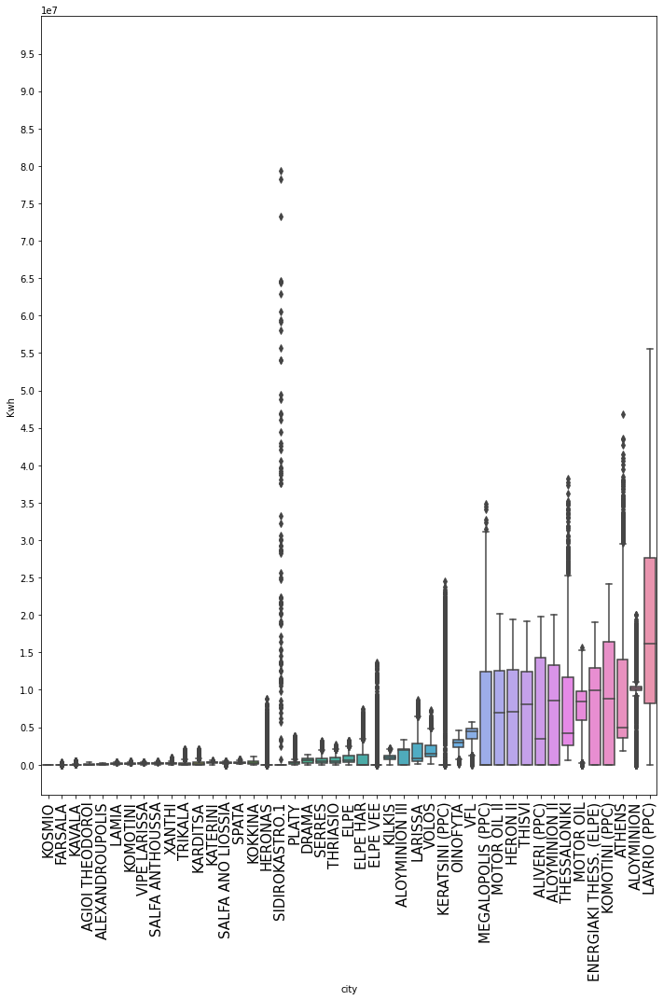

In [12]:
def create_boxplots(pd , neighbouring_countries=None,colour_list=None):
    """
    1.  Reads the initial dataframe df and copies 'load' and 'country' collumns (df_scaled)
    2.  Using df.describe() we get info about the load collumn grouped by countries (neighbouring_countries)
    3.  We sort that collumn based on mean value (given by desrcibe) and 
        make a list of the countries sorted by the mean of load collumn
    4.  then we sort our initial dataset based on the list in step 3 (neighbour_df)
    5.  Finally, we make side by side box plots of the distribution of load for each country 
        in our dataset
    Parameters: 
        neighbouring_countries: (optional) simple list of countries to plot side by side barplots
        colour_list: (optional) simple list of colours to colour neighbouring countries
        
    Returns: None
    -------
    """
    df_scaled = pd[['city', 'Kwh']].copy()
    
    if(neighbouring_countries is None):
        #group data by country and describe load data column
        neighbouring_countries = df_scaled.groupby('city')['Kwh'].describe()

        # sort above description by mean value and create the list of countries produced by that sorting
        neighbouring_countries = neighbouring_countries.sort_values(by=['mean']).index.get_level_values(0).to_list()

    # use the country column as index and sort dataset by the list of countries sorted by mean
    neighbour_df = df_scaled.set_index('city').loc[neighbouring_countries]

    neighbour_df.reset_index(inplace=True)
    fig, ax = plt.subplots()
    fig.set_size_inches(10, 15)
    if(colour_list is None):
        ax = sns.boxplot(x='city', y='Kwh', data=neighbour_df)
    else:
        ax = sns.boxplot(x='city', y='Kwh', data=neighbour_df,palette=colour_list)
        
    plt.xticks(fontsize=15, rotation=90)
    plt.yticks(range(0,100000000,5000000))
    plt.ylim(top=100000000) 
    plt.tight_layout()
    
create_boxplots(outcome)

In [13]:
def create_pivot_df(pd):
    """
    Reads the initial dataframe df and creates a pivot_table out of it
    Each row of the pivot table containts the mean (by default) value of 
    energy load at a specific datetime for all countries
    Each row is a different datetime, while each column is a different country
    Countries are sorted based on ascending mean value of energy load
    Parameters: None        
    Returns
    -------
    pandas.DataFrame
        The pivot table of the oriiginal dataframe as described above
    """
    # get description table (describe()) and group based on country for only "load" column
    neighbouring_countries = pd.groupby('city')['Kwh'].describe()

    # sort above description by mean value and create the list of countries produced by that sorting
    neighbouring_countries = neighbouring_countries.sort_values(by=['mean']).index.get_level_values(0).to_list()
    pivot_df = pd.pivot_table('Kwh', ['Date'], 'city')

    # sort columns based on ascending order of mean value per country (see boxplots above)
    pivot_df = pivot_df.reindex(columns=neighbouring_countries)
    print('NaN left in pivot table?: '+str(pivot_df.isnull().values.any()))
    return pivot_df

pivot_df = create_pivot_df(outcome)

NaN left in pivot table?: False


/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:681: RuntimeWarning: invalid value encountered in true_divide
  acf = avf[: nlags + 1] / avf[0]
/opt/conda/lib/python3.7/site-packages/matplotlib/axes/_base.py:2480: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


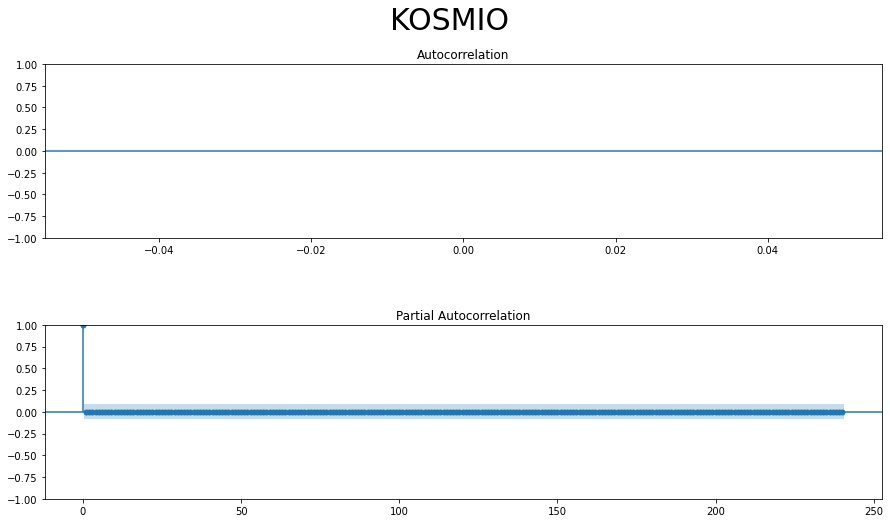

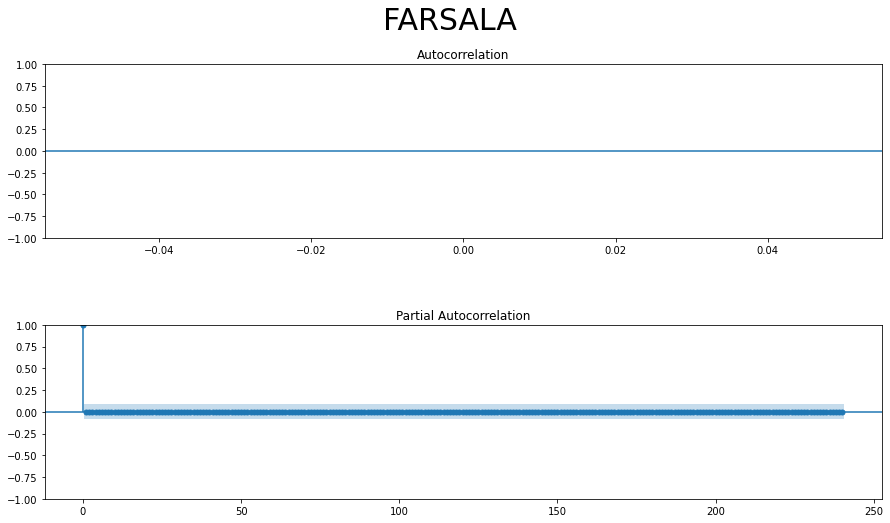

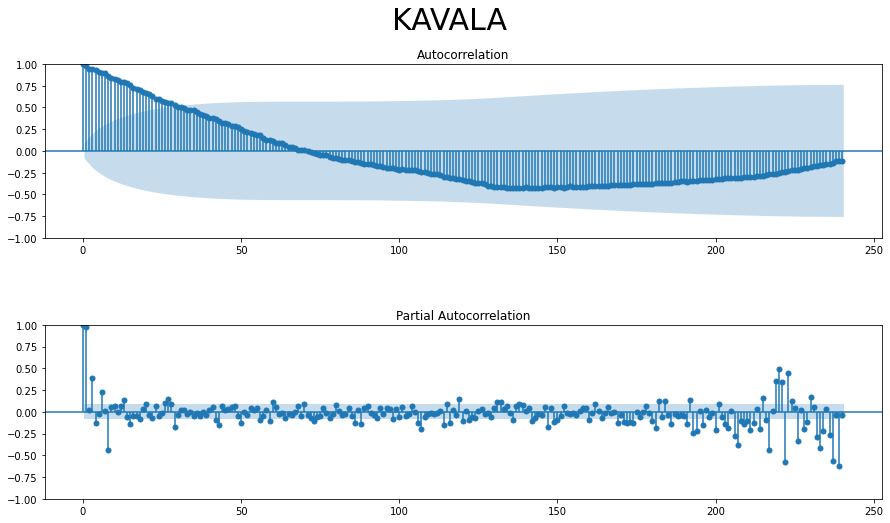

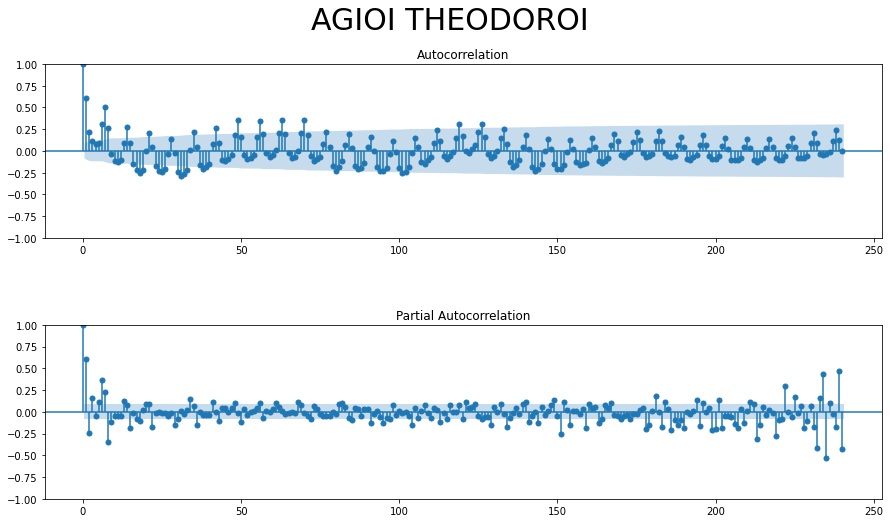

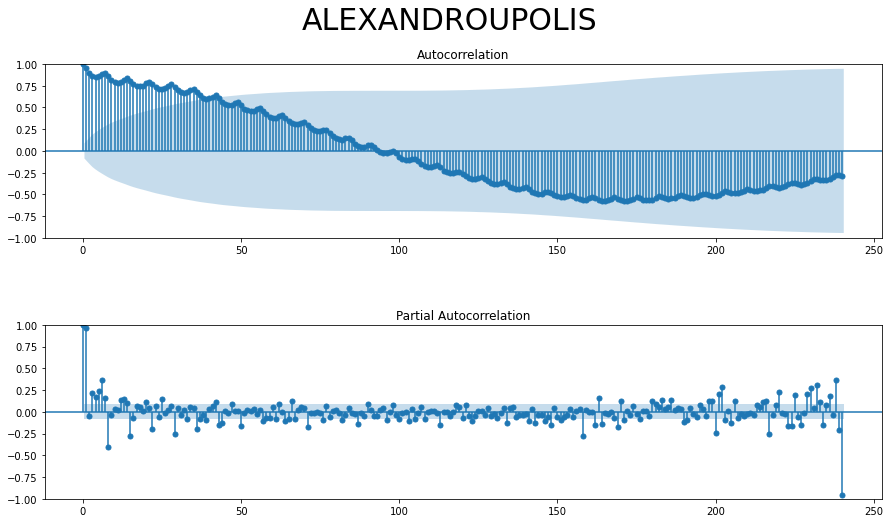

...

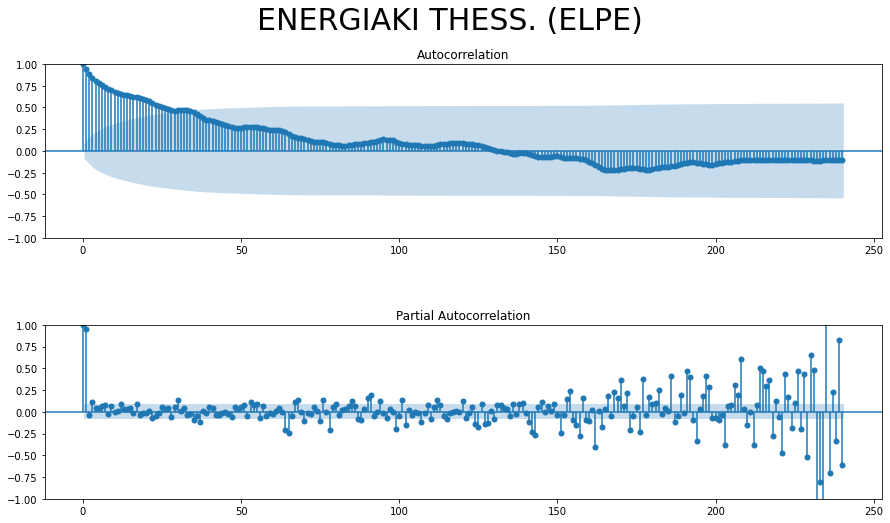

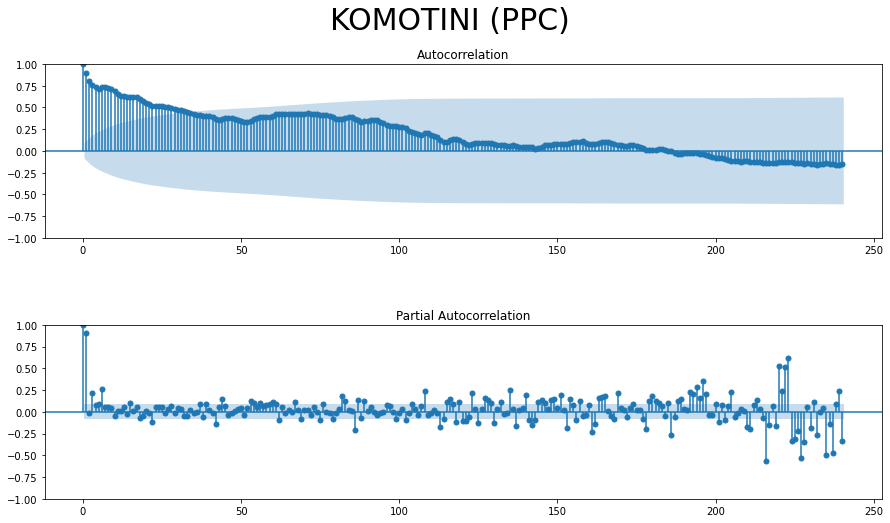

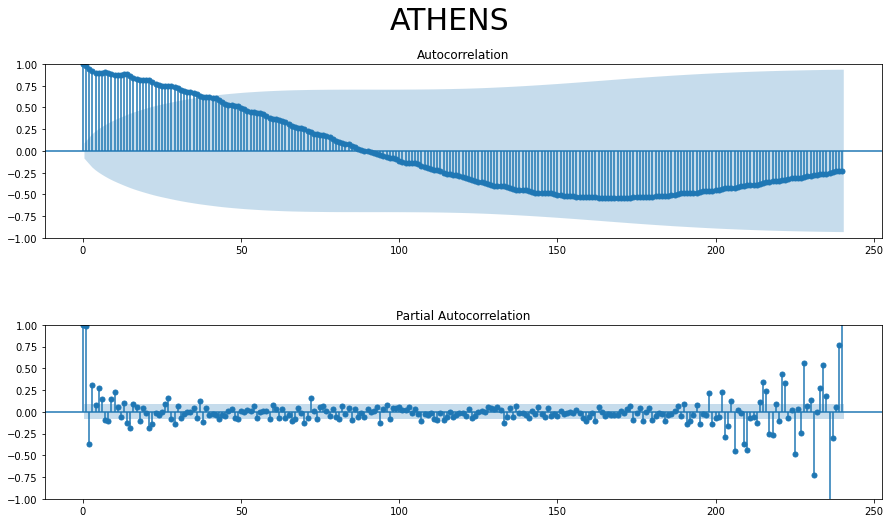

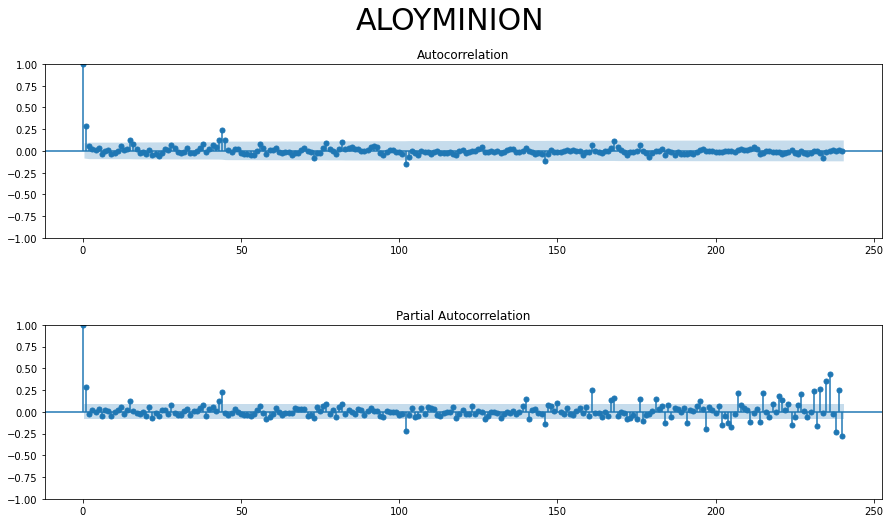

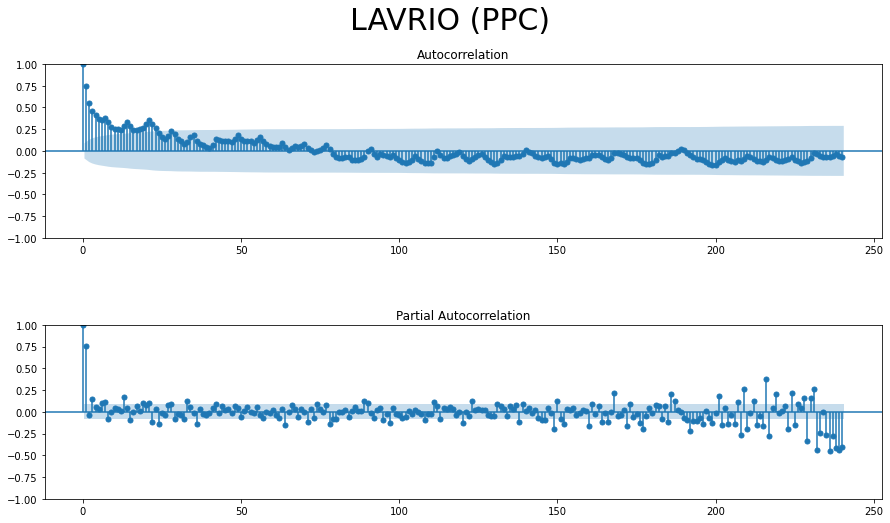

In [14]:
import statsmodels.api as sm

def plot_acf_pacf(dframe):
    """
    This function is used to plot acf/pacf plots for each country in our dataset
    Parameters: 
        dframe: pandas.dataframe (pivot table) where rows are data per country for one datetime        
    Returns: None
    -------
    """    
    # we need to remove NaN values since they can't be used for acf/pacf plots
    dframe_without_na = dframe.dropna()
    sample_size = 500 
    
    for city in dframe.columns:
        fig, ax = plt.subplots(2,1, figsize=(15, 8))
        fig.suptitle(city, fontsize=30)
        fig.subplots_adjust(hspace=0.5)
        
        """
        get a random value (idx) between 0 and lenth of current col 
        We subtract 'sample_size' so that rand_idx might not become a number that
        added with 'sample_size' can become more than length of current col 
        """
        rand_idx = np.random.randint(0,len(dframe_without_na[city].values)-sample_size)

        # get a contrinuous 'sample_size' values (sample) of dframe starting from said random idx
        dframe_sample = dframe_without_na.iloc[rand_idx : rand_idx+sample_size]
        
        # plot acf/pacf plots
        sm.graphics.tsa.plot_acf(dframe_sample[city], lags=24*10, ax=ax[0])    
        sm.graphics.tsa.plot_pacf(dframe_sample[city], lags=24*10, ax=ax[1], method='ols-adjusted')
        plt.show()
#         method must be one of: 'ols', 'ols-inefficient', 'ols-adjusted', 'yw', 'ywa', 'ld', 'ywadjusted', 'yw_adjusted', 'ywm', 'ywmle', 'yw_mle', 'lda', 'ldadjusted', 'ld_adjusted', 'ldb', 'ldbiased', 'ld_biased'
plot_acf_pacf(pivot_df)

In [15]:
pivot_df['KOSMIO'].head(30)
pivot_df.drop(labels=['KOSMIO'], axis=1, inplace=True)

In [16]:
import random
import string

def country_histograms(dframe,colourmap='tab20',country_list=None):
    """
    In this function, we create overlapping histograms where each histogram is 
    for a different country 
    Parameters: 
        dframe: pandas.dataframe for plotting histogram
        colourmap: string representing matplotlib set of colours for histogram
        country_list: (optional) list of countries to explicitely add to histogram
    ----------
    Returns: None
    -------
    """
    custom_lines = []
    countries = []
    pallete = []

    fig, ax = plt.subplots(figsize=(20,15))
    
    if country_list is not None:  # if used by other function
        # get columns that contain any country from the list 'weak_corr_countries'
        temp = dframe.drop(columns=[col for col in pivot_df 
                                      if col not in country_list])
    else: #if used independently
        # see code from previous cell for relative explanation of code
        temp = dframe
    
    ax.set(xlabel='Energy In', ylabel='Count')
    ax.set_title('Overlapping Histograms for each city',fontsize = 40)
    custom_fontsize = 10

    # ~~~~~~~~~~~~~~~~~~~~~ Colour based on cmap ~~~~~~~~~~~~~~~~~~~~~~~~~~
    # https://matplotlib.org/stable/tutorials/colors/colormaps.html    
    cmap_samples = mpl.cm.get_cmap(colourmap) 
    """
    colours change every 1/#colours (1/20 = 0.05), so for each value where there
    is new colour we add that colour, using cmap(), in a list and cycle through
    that list for every histogram we plot
    """
    for val in np.arange(0, 1, 0.05).tolist(): pallete.append(cmap_samples(val))
    pallete_cycler = cycle(pallete)
    
    for idx, col in enumerate(temp.columns):
        # ~~~~~~~~~~~~~~~~~~~ Randrom colour per hist ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
#         cur_colour = "#" + ''.join(random.choices("ABCDEF" + string.digits, k=6))

        # ~~~~~~~~~~ Colour based on max correlation of country ~~~~~~~~~~~~~~~~~
#         sorted_corr = dframe.corr().unstack().sort_values().drop_duplicates()
#         max_corr = sorted_corr[col][:].max()
#         cur_colour = cmap(max_corr)

        # ~~~~~~~~~~ Colour based on a mlp cmap ~~~~~~~~~~~~~~~~~
        cur_colour = next(pallete_cycler)

        sns.histplot(temp[col], ax=ax, kde=True, color=cur_colour)
        custom_lines.append(Line2D([0], [0], color=cur_colour, lw=4))
        countries.append(col)

    ax.legend(custom_lines, countries, fontsize=10)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)

In [17]:
def corr_heatmap(dframe,cluster_labels=None):
    """
    Creates correlation map of dframe between different countries 
    Parameters: 
        dframe: pandas.dataframe of our dataset
        cluster_labels: (optionally) list of labels from hierarchical clustering (see create_dendrogram() below)
    ----------
    Returns: None
    -------
    """
    # Compute the correlation matrix (excluding NA/null values)
    corr = dframe.corr()
    
    cmap = 'Spectral_r'
    # Generate a mask for the upper triangle
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(20, 15))

    # Draw the heatmap with the mask and correct aspect ratio
    res = sns.heatmap(corr, mask=mask, cmap=cmap, square=True, annot=True, 
                      annot_kws={"size": 10}, ax=ax)

    # size of country names
    res.set_xticklabels(res.get_xmajorticklabels(), fontsize = 10, rotation = 90)
    res.set_yticklabels(res.get_ymajorticklabels(), fontsize = 10, rotation = 0); # ";" to supress print in cell

    # change font size of heatmap colourbar
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=20)
    ax.set_title('Country Correlation Heatmap',fontsize = 40)

#     weak_corr_countries = ['NEA MESIMVRIA','KIPI','AIA TRIADA','SIDIROKASTRO']
    
    # create histogram for countries 
    if cluster_labels is not None:
        for cluster, countries in cluster_labels.items():
            country_histograms(dframe,cmap,countries)
    else:
        pass
#         country_histograms(dframe,cmap,weak_corr_countries)

In [18]:
import plotly.express as px
import plotly.graph_objects as go

def create_choropleth(eu_countries=None,colour_list=None):
    """
     This function is used by dendrogram to create a choropleth europe map based on grouping of dendrogram
     Parameters: 
        eu_countries: list of countries grouped by dendrogram 
        colour_list: list of colours used by dendrofram
    ----------
    Returns: None
    -------
    """ 
    geo_df = pd.DataFrame()
    
    geo_df['city'] = eu_countries
    geo_df['colour'] = colour_list

    fig = px.choropleth(geo_df, locations='city',
                        color='colour', 
                        hover_name='city', 
                        hover_data=['city'], 
                        title='City Grouping',
                        locationmode= 'ISO-3',
                        projection='natural earth',
                        scope ='greece')
    fig.show()
    

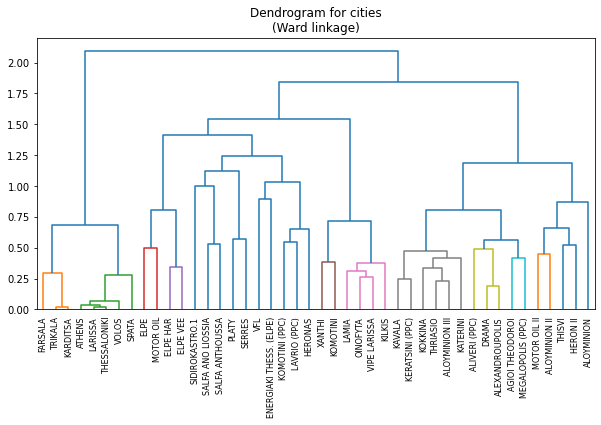

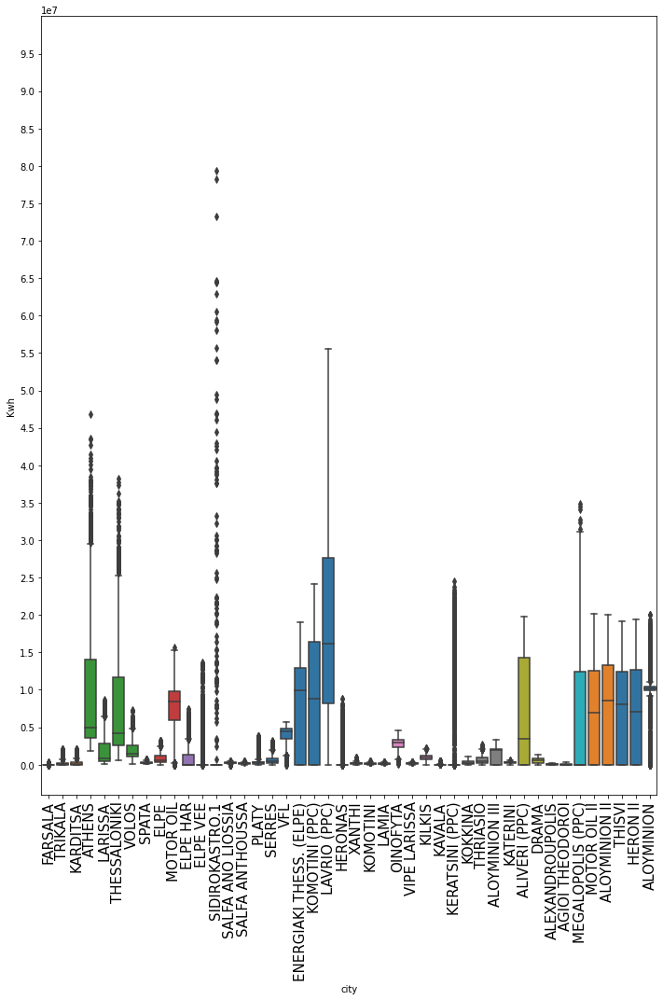

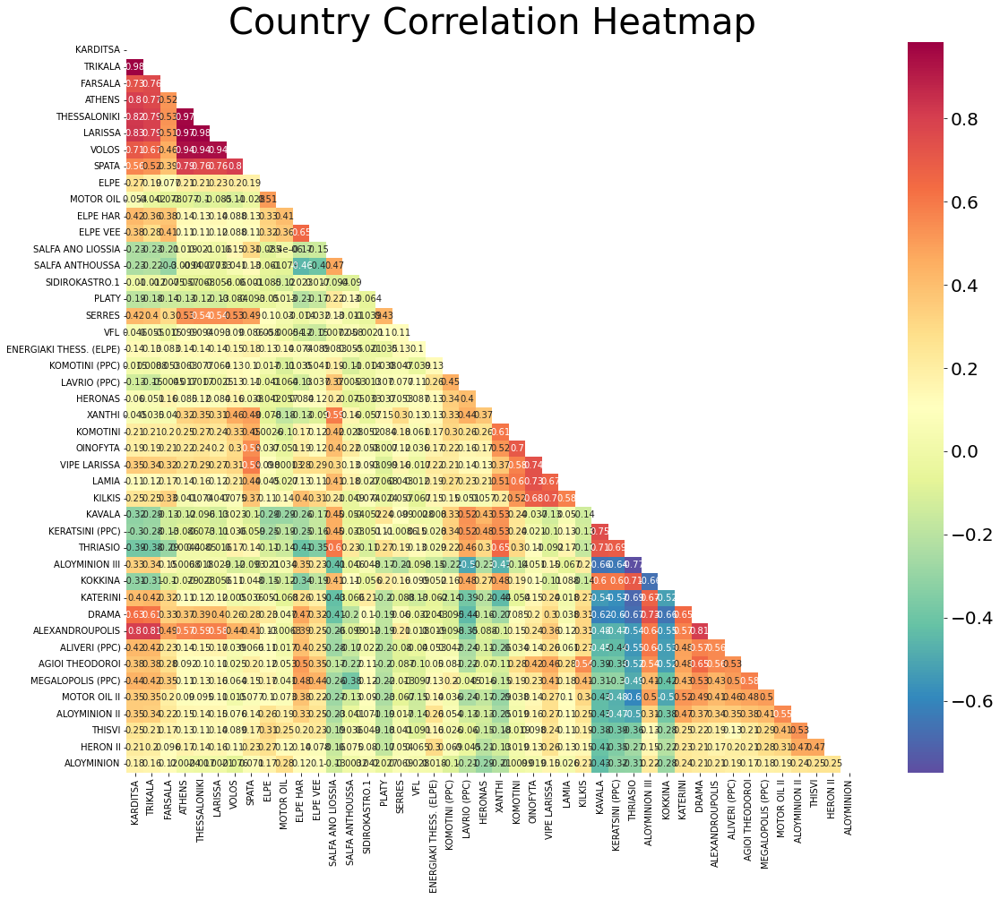

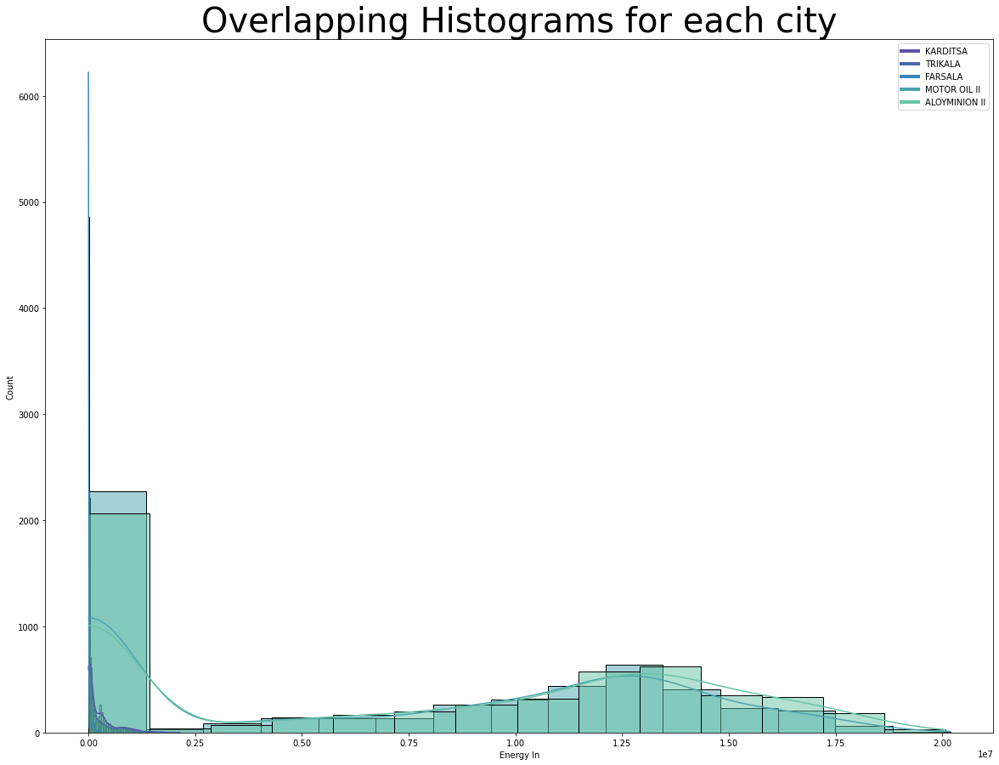

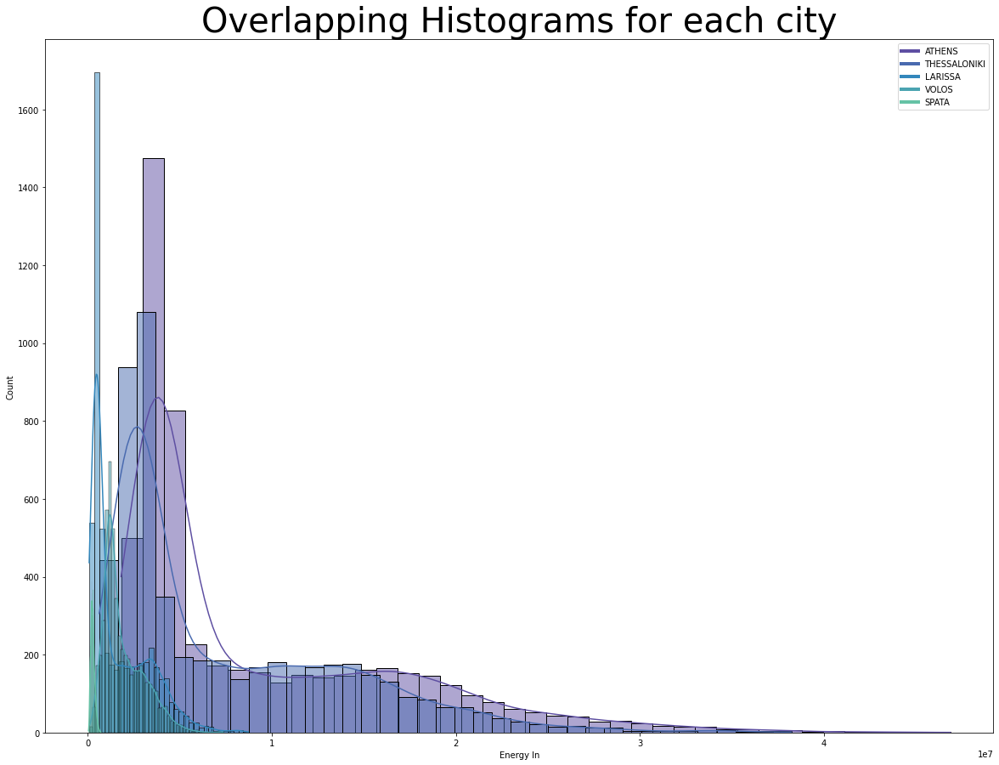

...

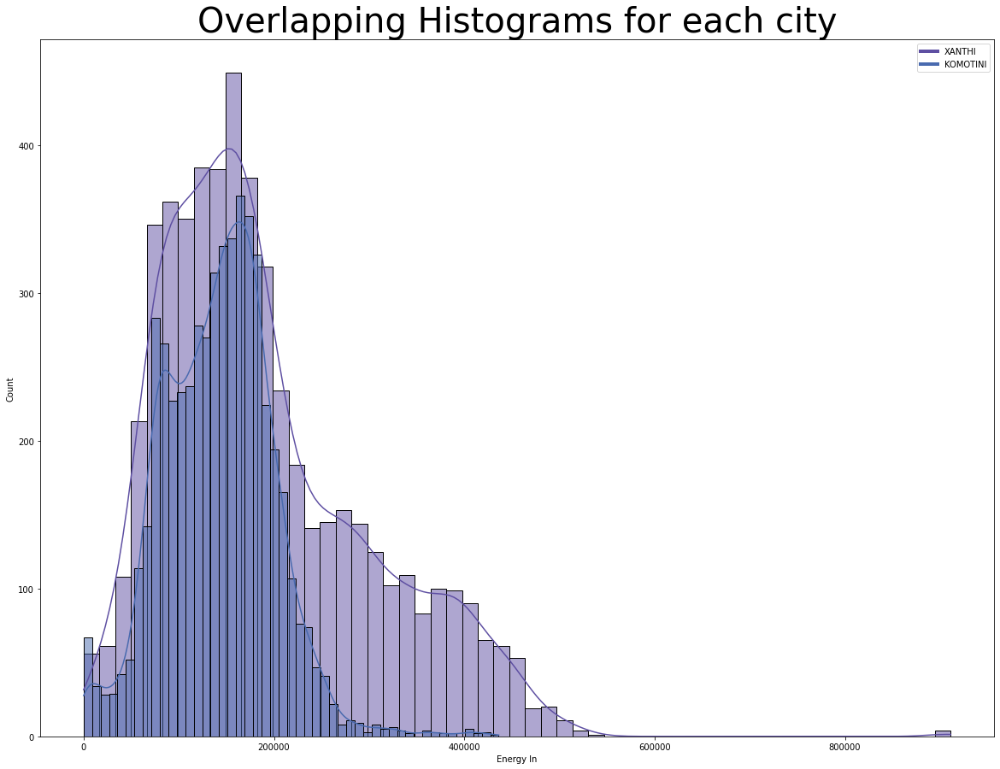

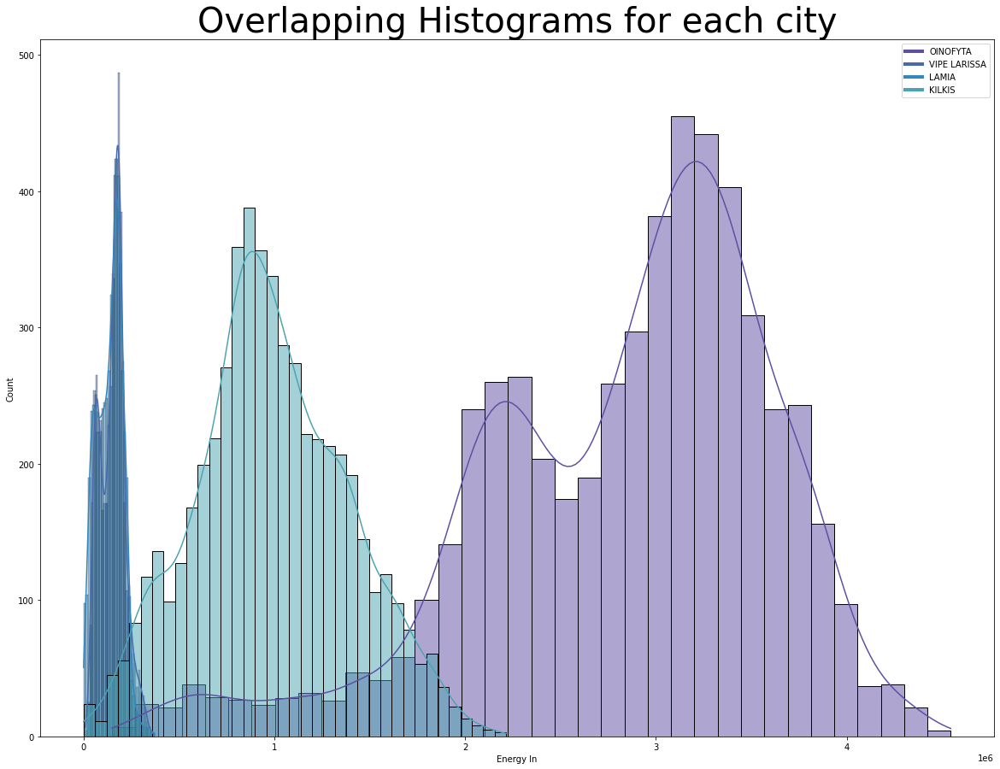

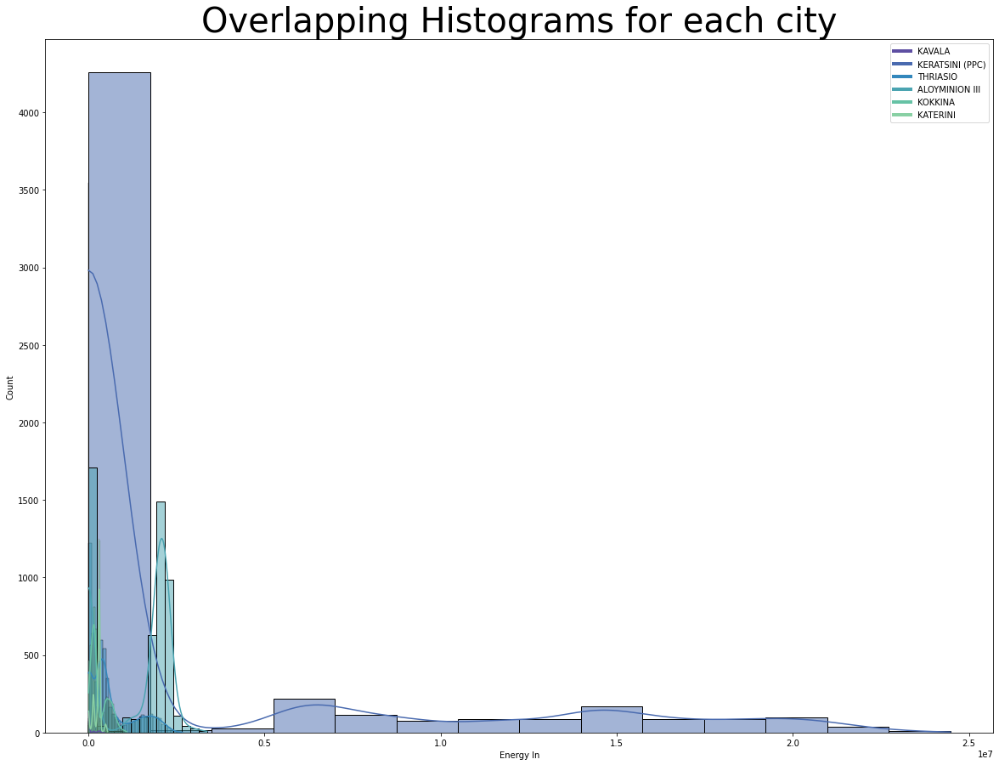

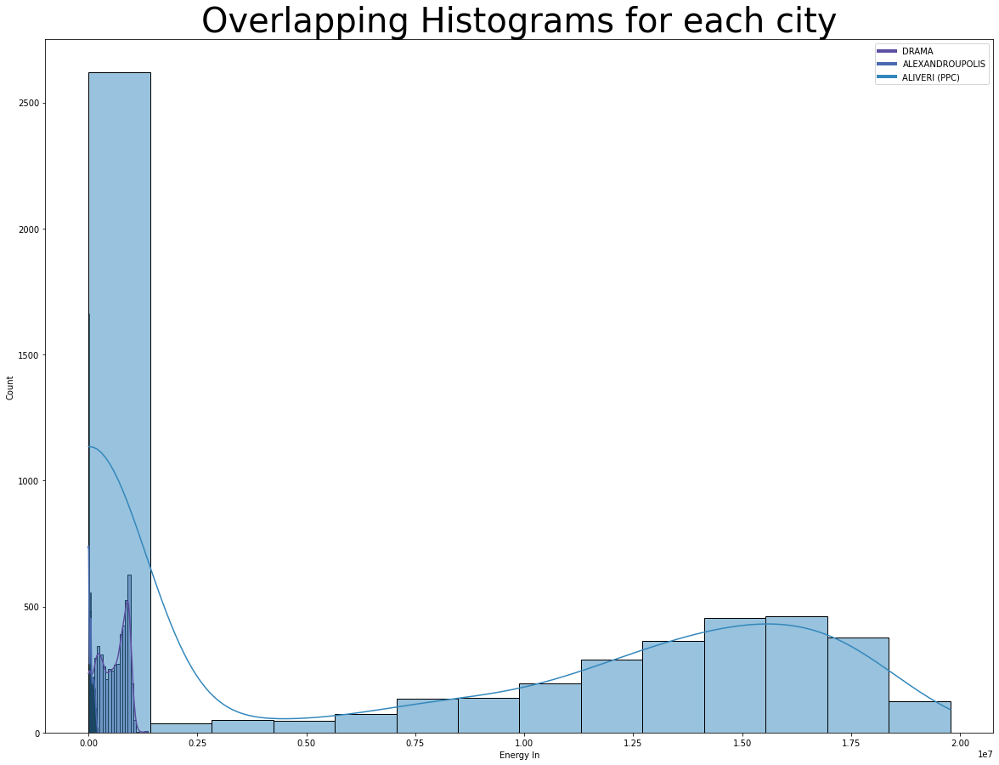

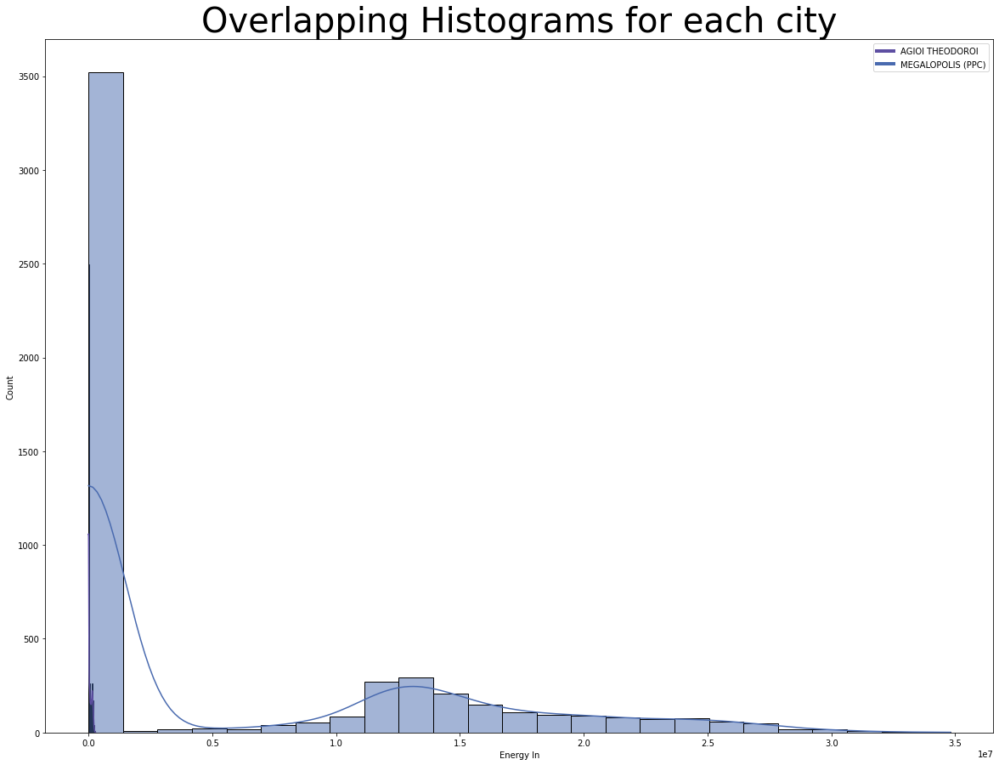

In [19]:
# https://www.kaggle.com/code/sgalella/correlation-heatmaps-with-hierarchical-clustering
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import squareform
from collections import defaultdict

def clusterize_corr(Z,dframe):
    '''
    This function is used by dendrogram to create the dataframe where countries
    with greater correlation are grouped together to be later displayed by the heatmap
    Parameters: 
        Z: ndarray and linkage() return value 
        cluster_labels: pandas.dataframe used for clustering
    ----------
    Returns: 
        Dataframe where labels are sorted based on clustering of dendrogram 
    -------
    '''
    # Clusterize the data
    threshold = 0.05
    labels = fcluster(Z, threshold, criterion='distance')
    
    # Keep the indices to sort labels
    labels_order = np.argsort(labels)
    
    pivot = dframe.copy() #create copy of dframe to avoid permanent changes
    
    # Build a new dataframe with the sorted columns
    for idx, i in enumerate(pivot.columns[labels_order]):
        if idx == 0:
            clustered = pd.DataFrame(pivot[i])
        else:
            df_to_append = pd.DataFrame(pivot[i])
            clustered = pd.concat([clustered, df_to_append], axis=1)
    
    return clustered

def group_dendrolabels(dendro):
    '''
    Creates list of list, where each internal list is a cluster with its countries    
    
    The apperant pattern is that legs positioned at leaves will end with 5. 
    The reason is to nicely place the leg at the middle of the corresponding leaf index value. 
    This also implies the actual list indices of the leaf are multiplied by 10.
    Thus we first subtract 5 from each colors icoord, then divide by 10. 
    If the resulting number is close to the closest integer, 
        we consider this to be an index for a leaf and add its labe to the dict
    If not, then the colored tree we got it from is from non-leaf parts of the trees.
    Parameters: 
            dendro: dict and return value of dendrogram
    ----------
    Returns: 
        list of labels based on clustering of dendrogram 
    -------    
    '''
#     print(dendro['ivl'])
#     print(dendro['icoord'])
    cluster_labels = defaultdict(list)

    for colours, icoords in zip(dendro['color_list'], dendro['icoord']):
        for leg in icoords[1:3]:
            num = (leg - 5.0) / 10.0
            if abs(num - int(num)) < 1e-5:
                cluster_labels[colours].append(dendro['ivl'][int(num)])
    
    return cluster_labels
    
def create_dendrogram(dframe):
    
    
    dframe.replace(np.nan, 0.0,inplace=True)

    
    
    '''
    Dendrogram() uses the linkage matrix (encoding the hierarchical clustering) to render as a dendrogram
    
    The scipy.cluster.hierarchy.linkage function accepts either a: 
        1-D condensed distance matrix or 
        2-D array of observation vectors
    Therefore i use scipy.spatial.distance.squareform to convert my 2-D distance matrix (corr)
    into a 1-D condensed one
        Parameters: 
            pandas.dataframe for creating dendrogram based on correlation
    ----------
    Returns: None
    -------
    '''
    corr = dframe.corr()
    
    """
    - squareform requires distance (dissimilarity) matrix 
    - If the correlation² between two random variables is r,
      then their correlation distance is defined as d = 1-r.
      (https://medium.com/swlh/is-correlation-distance-a-metric-5a383973978f)
    """
    dissimilarity = 1 - abs(corr)
    sqform = squareform(dissimilarity)

    plt.figure(figsize=(10,5))
    plt.title("Dendrogram for cities\n(Ward linkage)")    
    
    # Perform hierarchical/agglomerative clustering.
    Z = linkage(sqform, 'ward', optimal_ordering=True) 
    
    # create dendrogram     
    dendro = dendrogram(Z, labels=dframe.columns,color_threshold=0.5,
                        orientation='top', leaf_rotation=90);
    plt.show()
    
    clustered = clusterize_corr(Z,dframe)
   
    cluster_labels = group_dendrolabels(dendro)

    create_boxplots(outcome,dendro['ivl'],dendro['leaves_color_list'])    
    corr_heatmap(clustered,cluster_labels)    
#     create_choropleth(dendro['ivl'],dendro['leaves_color_list'])
    
create_dendrogram(pivot_df)

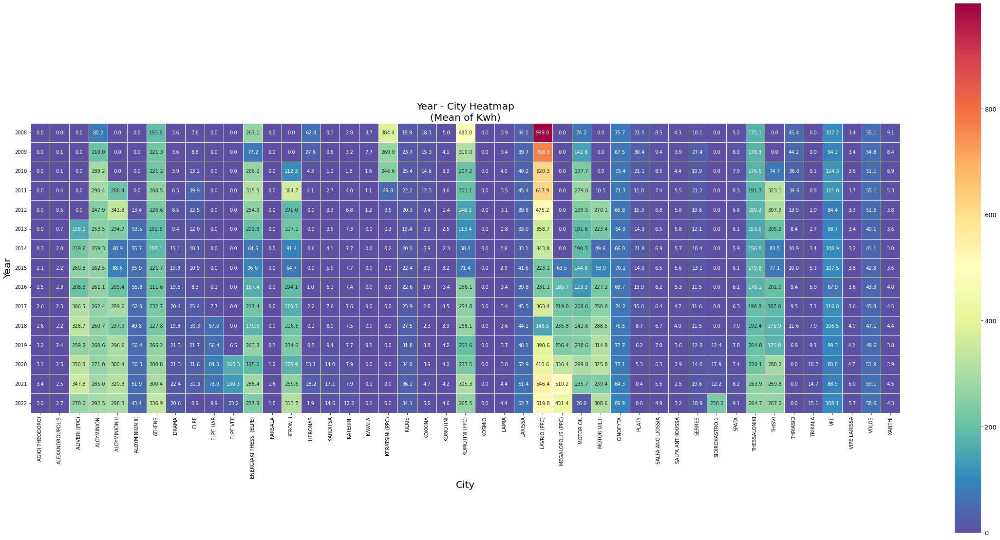

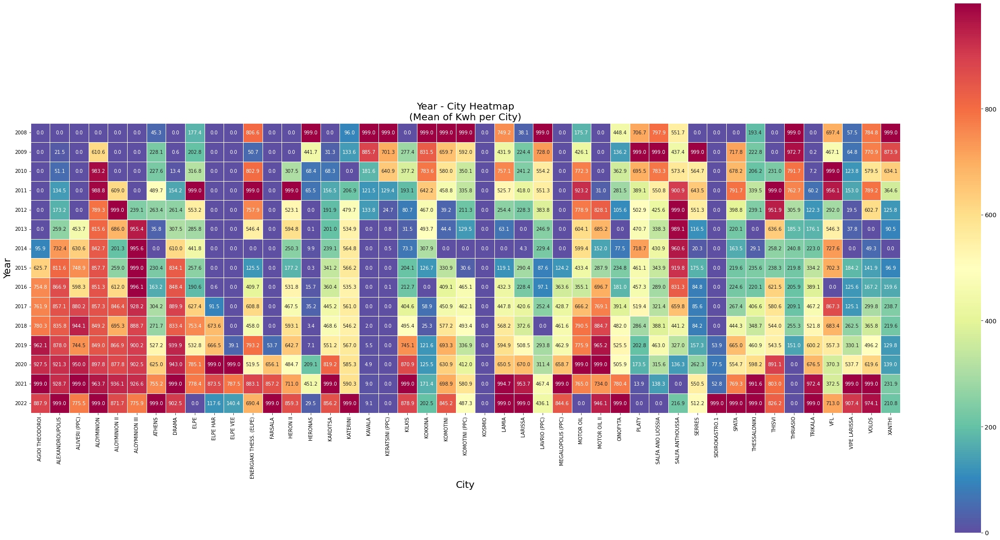

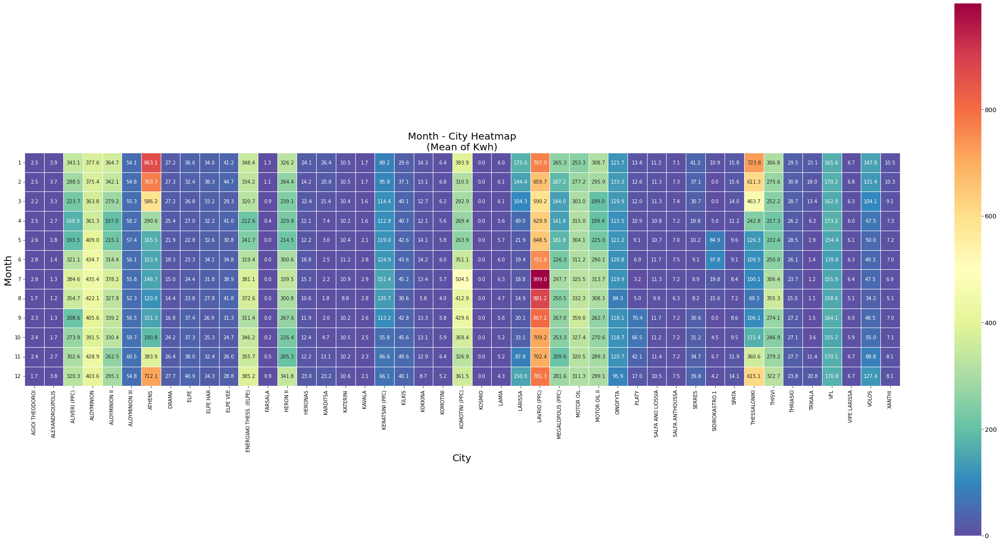

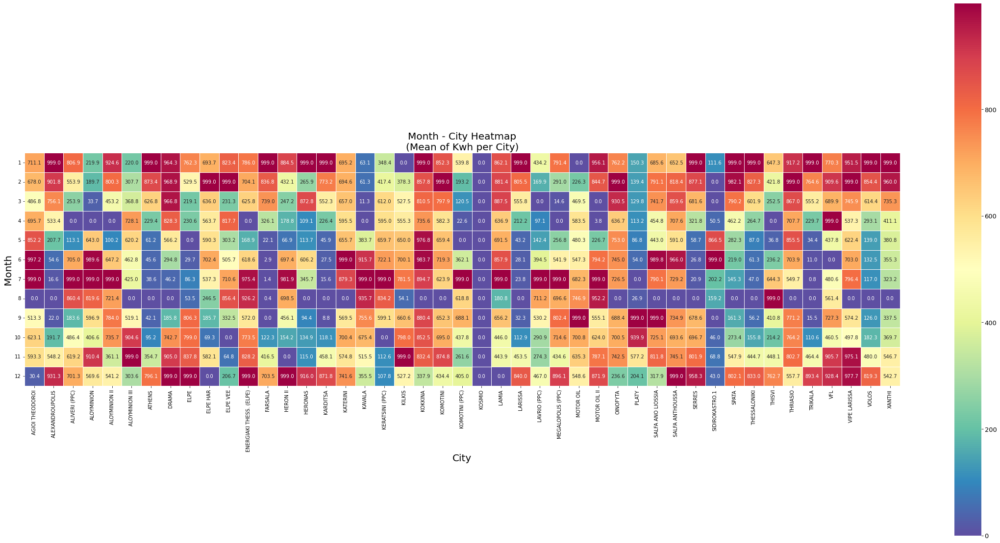

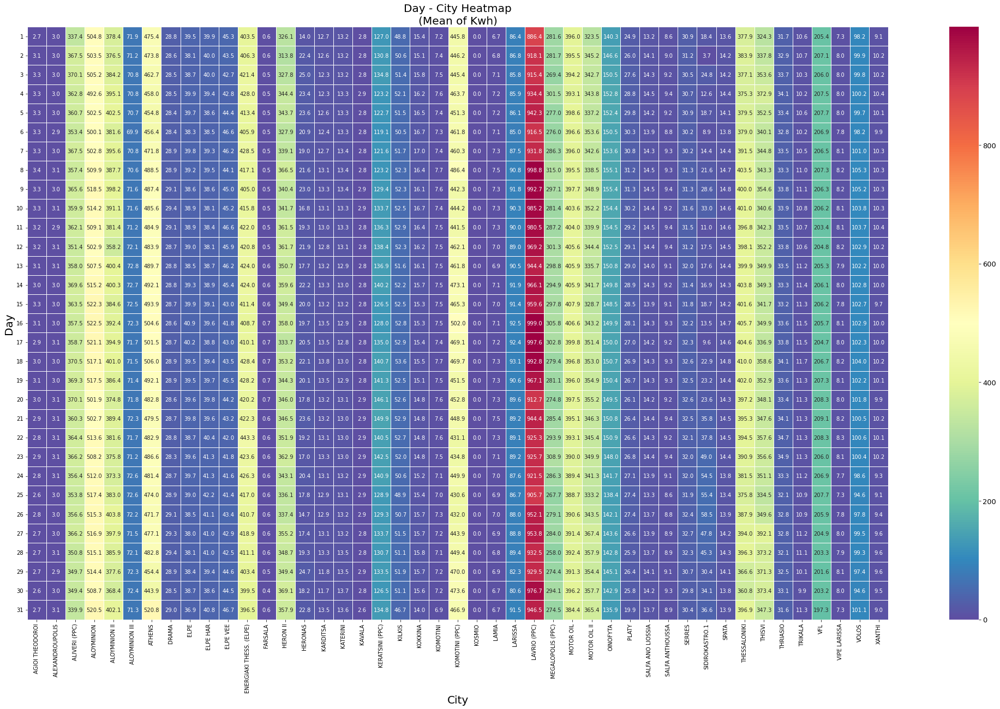

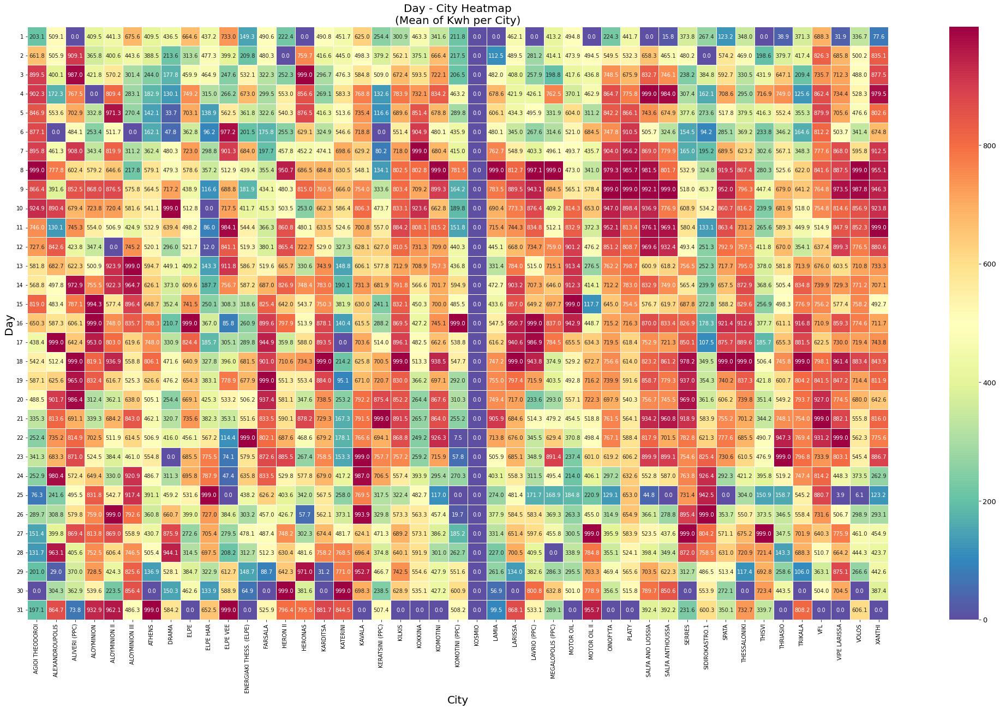

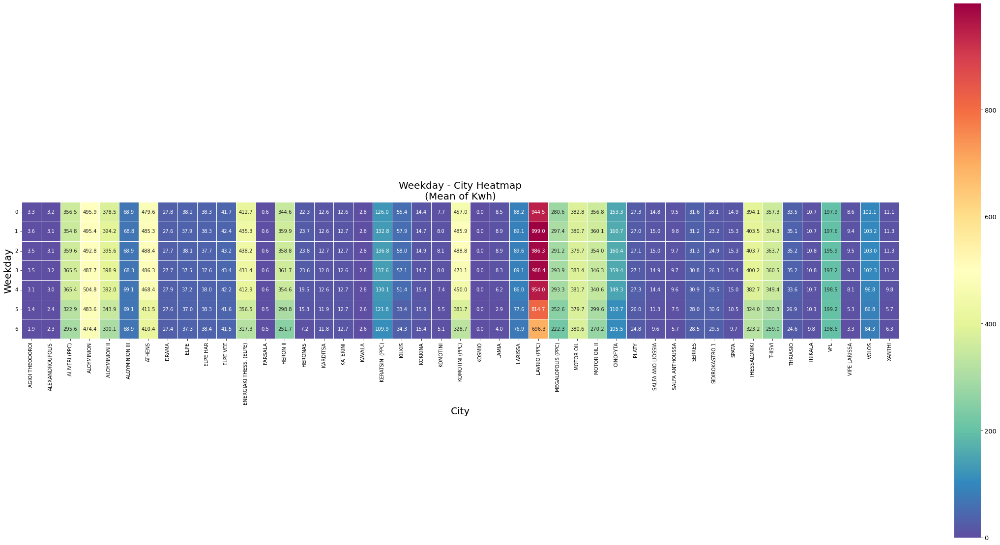

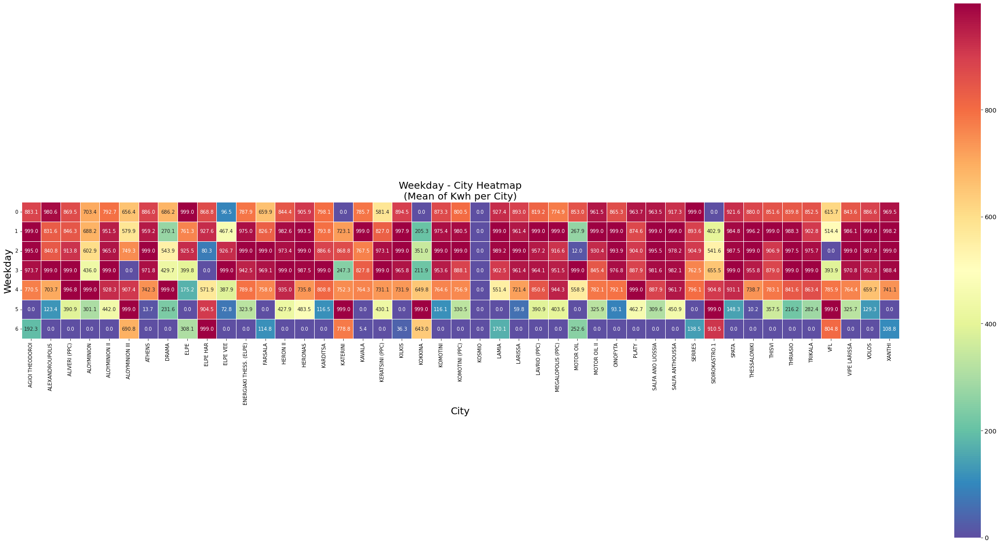

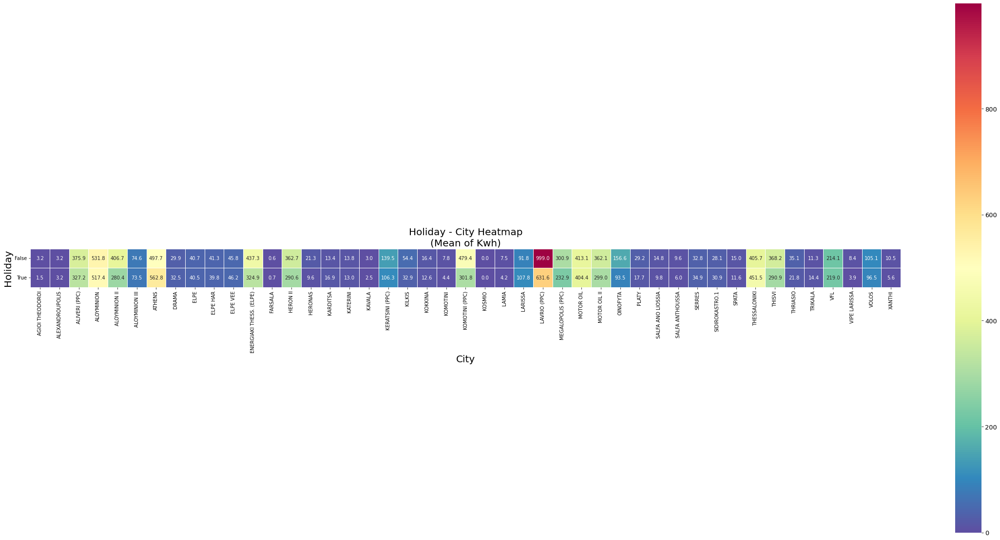

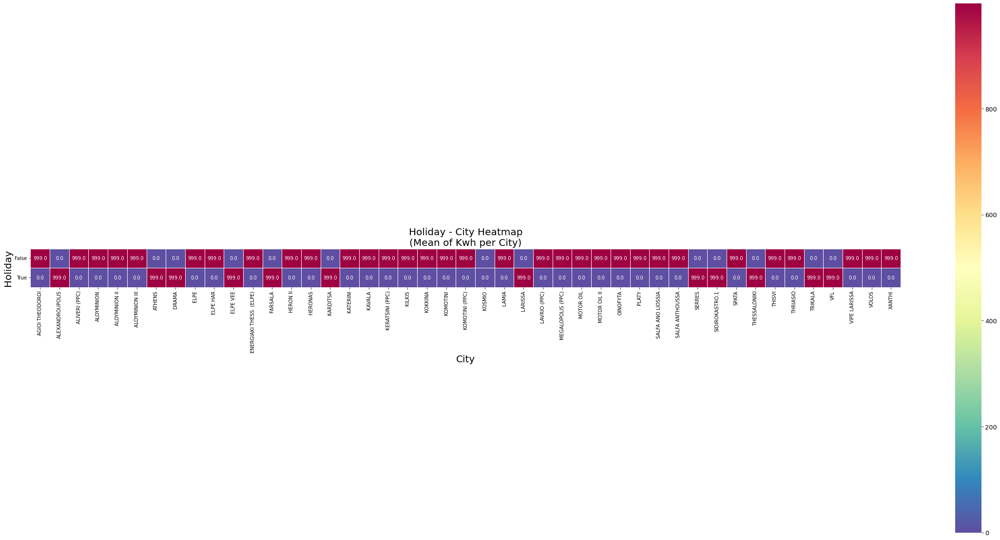

In [20]:
def plot_hmap(dframe, col, annot_size, aggfunc, plot_title):
    """
    This function jus creates the heatmaps of dataframes formed in date_heatmap()
    Parameters: 
        dframe: Pandas.dataframe containing dataframe for heatmap
        col: string which is the name of dframe column and what y-axis of heatmap is going to represent 
        annot_size: size of text inside cells of heatmap
        aggfunc: string containing aggregration function used (title of plot)
    ----------
    Returns: None
    -------
    """
    f, ax = plt.subplots(figsize=(40, 20))
    plt.title(plot_title, fontsize=annot_size+10)

    # Draw the heatmap with the mask and correct aspect ratio
    res = sns.heatmap(dframe, cmap='Spectral_r', square=True, annot=True, 
                      fmt='.1f', annot_kws={"size": annot_size}, ax=ax, linewidths=.9)

    # size of country names
    res.set_xticklabels(res.get_xmajorticklabels(), fontsize = annot_size, rotation = 90)
    res.set_yticklabels(res.get_ymajorticklabels(), fontsize = annot_size, rotation = 0); # ";" to supress print in cell

    #change size of axis labels
    ax.set_xlabel('City', fontsize = annot_size+10)
    ax.set_ylabel(col.title(), fontsize = annot_size+10)

    # change font size of heatmap colourbar        
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=annot_size+3)
    
    
def date_heatmap():
    """
    Creates a heatmap where for each country and for some datetime aspects (see values in col paramter)
    displays the sum/mean of energy load for that given col based dataframe,scaled between 0 and 100
    based on min/max values of matrix
    Parameters: None
    ----------
    Returns: None
    -------
    """
    # define our scaling function with custom min/max possible values that x might have 
    scale_func = lambda x: (((x - min) / (max - min))*999)
    
    aggfunc = 'mean' # values: mean/sum/count/max/min
    
    for col in ['year', 'month','day','weekday','holiday']:
        # create pivot table with index a given column
        pivot = outcome.pivot_table('Kwh', [col], 'city', aggfunc=aggfunc)
        
        """
         Use lambda function above to perform minmax scaling column-wise
         We want out min/max values to be for the whole pivot_table, so sklearn.MinMaxScaler was avoided
         This can be explained by its min()/max() methods which, for a pivot_table, return
         the min/max per column and not of pivot_table (setting of custom methods was in order)
        """
        # find min/max value out of min/max values of all countries (columns)         
        min = pivot.min().min()
        max = pivot.max().max()              
        totalscaled_pivot = pivot.copy()
        totalscaled_pivot[pivot.columns] = scale_func(pivot[pivot.columns]).round(2) #round to two (2) decimals   
        
        countryscaled_pivot = pivot.copy()
        scaler = MinMaxScaler(feature_range=(0, 999)) # scale in specific range
        countryscaled_pivot[pivot.columns] = scaler.fit_transform(pivot[pivot.columns]).round(2)         

        if col=='yearweek': annot_size = 15
        else: annot_size = 10

        # ~~~~~~~~~~~~~~~~~~~~~~~~~~ Plot heatmaps ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~    
        
        plot_title = col.title()+' - City Heatmap\n({} of Kwh)'.format(aggfunc.title())
        plot_hmap(totalscaled_pivot, col, annot_size, aggfunc, plot_title)   # Heatmap normalized by all values
        
        plot_title = col.title()+' - City Heatmap\n({} of Kwh per City)'.format(aggfunc.title())
        plot_hmap(countryscaled_pivot, col, annot_size, aggfunc, plot_title) # Heatmap normalized by country
        
date_heatmap()

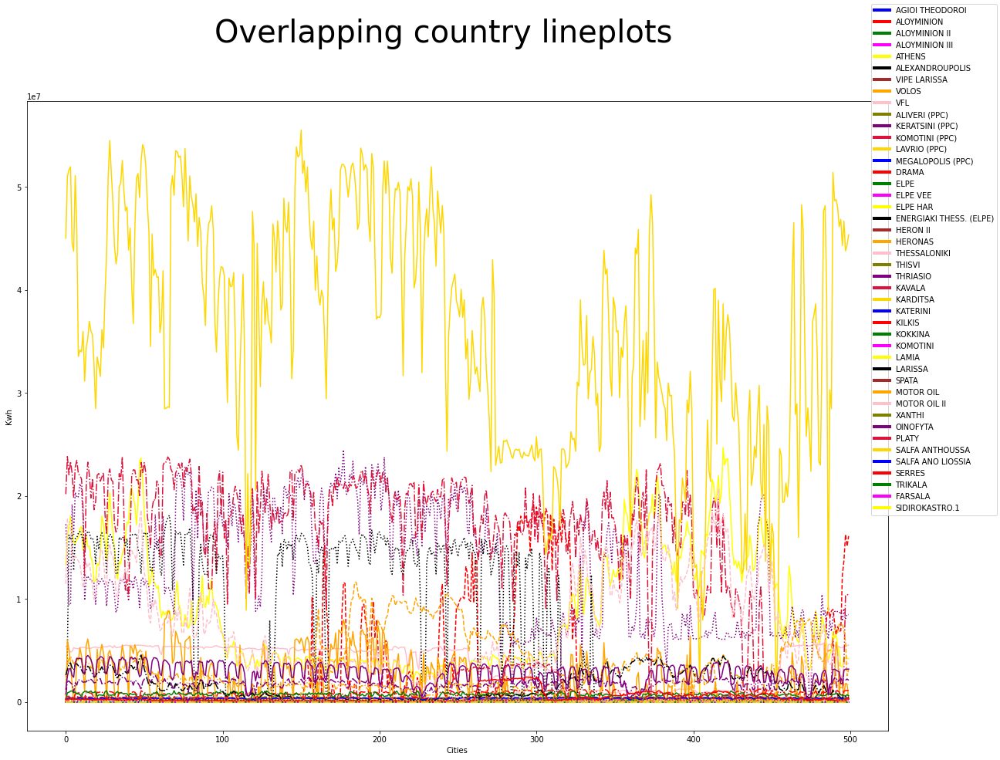

In [21]:
ls = ['-','--',':','-.','-','--',':','-.']
linecycler = cycle(ls) #create an object that can circle around that list

fig, ax = plt.subplots(figsize=(20,15))
fig.suptitle('Overlapping country lineplots', fontsize=40)
fig.subplots_adjust(hspace=0.5) # create space between vertical plots (by axes)

custom_lines = []
country_list = []
colours = ['blue','red','green','magenta','yellow',
           'black','brown','orange','pink','olive',
           'purple','crimson','gold','blue','red','green','magenta','yellow',
           'black','brown','orange','pink','olive',
           'purple','crimson','gold','blue','red','green','magenta','yellow',
           'black','brown','orange','pink','olive',
           'purple','crimson','gold','blue','red','green','magenta','yellow',
           'black','brown','orange','pink','olive',
           'purple','crimson','gold'] # list of colours for plots
colour_iter = iter(colours) #iterator for list of colours

pivot = pivot_df.reset_index()
pivot[pivot['Date'].dt.year == 2019]
dframe_without_na = pivot.dropna()

rand_idx = 500 # 500/24 = 20 days approximately

for country in ['AGIOI THEODOROI','ALOYMINION', 'ALOYMINION II','ALOYMINION III', 'ATHENS', 'ALEXANDROUPOLIS', 'VIPE LARISSA','VOLOS', 'VFL', 'ALIVERI (PPC)', 'KERATSINI (PPC)', 'KOMOTINI (PPC)', 'LAVRIO (PPC)', 'MEGALOPOLIS (PPC)', 'DRAMA', 'ELPE', 'ELPE VEE', 'ELPE HAR', 'ENERGIAKI THESS. (ELPE)', 'HERON II', 'HERONAS', 'THESSALONIKI', 'THISVI','THRIASIO','KAVALA','KARDITSA','KATERINI','KILKIS','KOKKINA','KOMOTINI','LAMIA','LARISSA','SPATA','MOTOR OIL','MOTOR OIL II','XANTHI','OINOFYTA','PLATY','SALFA ANTHOUSSA','SALFA ANO LIOSSIA','SERRES','TRIKALA','FARSALA','SIDIROKASTRO.1' ]:
    cur_colour = next(colour_iter) 
    cur_linestyle = next(linecycler)
    
    # get a contrinuous 'sample_size' values (sample) of dframe starting from said random idx
    dframe_sample = dframe_without_na.iloc[0 : rand_idx]

    sns.lineplot(data=dframe_sample[country], color=cur_colour, ax=ax, linestyle=cur_linestyle)
    ax.set(xlabel='Cities', ylabel='Kwh')

    # add lines and labels for legend based on those used for lineplot above
    custom_lines.append(Line2D([0], [0], color=cur_colour, lw=4))
    country_list.append(country)

fig.legend(custom_lines, country_list);

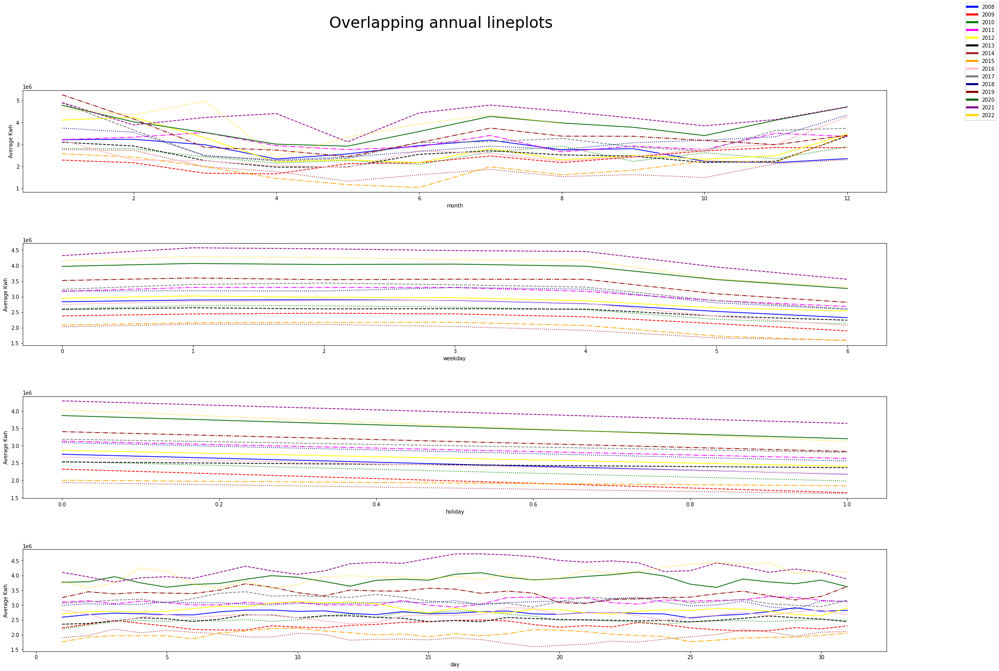

In [22]:
def annual_lineplots():
    """
    Above we plot lines where each line is a different year to demonstrate how values shift 
    on average every year based on yearweek/weekday/hour.
    In the x-axis, we display the datetime (52/6/24 values for yearkweeks/weekdays/hours per year respectively). 
    In the y-axis, it is the average value of a given x-axis for that year
    Parameters: None
    ----------
    Returns: None
    -------
    """
    # make a list out of possible linestyle we want our line plots to have
    ls = ['-','--',':','-.','-','--',':','-.']
    linecycler = cycle(ls) #create an object that can circle around that list

    fig, ax = plt.subplots(4, 1, figsize=(30,20))
    fig.suptitle('Overlapping annual lineplots', fontsize=30)
    fig.subplots_adjust(hspace=0.5) # create space between vertical plots (by axes)

    custom_lines = []
    years = []
    colours = ['blue','red','green','magenta','yellow','black','brown','orange','pink',"grey",'darkblue','darkred','darkgreen','darkmagenta','gold',] # list of colours for plots
    colour_iter = iter(colours) #iterator for list of colours
    
    
    #for each unique year in our dataset (2015-2022)
    for year in outcome['year'].unique():
    #     cur_colour = "#" + ''.join(random.choices("ABCDEF" + string.digits, k=6))
        #get a new colour and linestyle to plot
        cur_colour = next(colour_iter) 
        cur_linestyle = next(linecycler)
        
        # for each datetime_parameter we want our x-axis to be
        for axes,datetime_cov in enumerate(['month', 'weekday', 'holiday', 'day']):
            # find the mean value of energy load for each datetime_parameter for a given year based 
            temp = outcome[outcome['year']==year].groupby(datetime_cov)['Kwh'].mean()
            sns.lineplot(data=temp, color=cur_colour, ax=ax[axes], linestyle=cur_linestyle)
            ax[axes].set(xlabel=datetime_cov, ylabel='Average Kwh')
        
        # add lines and labels for legend based on those used for lineplot above
        custom_lines.append(Line2D([0], [0], color=cur_colour, lw=4))
        years.append(year)
    
    fig.legend(custom_lines, years)

annual_lineplots()

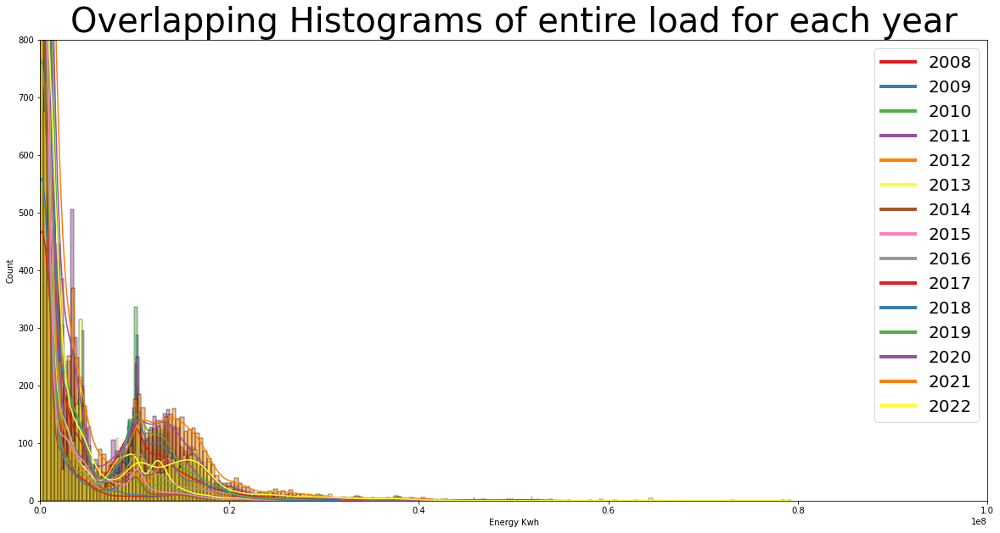

In [23]:
def year_histograms():
    """
    In this function, we create overlapping histograms where each histogram is 
    the entirety of our dataset (all countries) for a different year 
    Parameters: None
    ----------
    Returns: None
    -------
    """
    # see code from previous cell for relative explanation of code
    custom_lines = []
    years = []
    pallete = []
    # ~~~~~~~~~~~~~~~~~~~~~ Colour based on cmap ~~~~~~~~~~~~~~~~~~~~~~~~~~
    cmap = mpl.cm.get_cmap('Set1')    
    for val in np.arange(0, 1, 0.12).tolist(): pallete.append(cmap(val))
    pallete_cycler = cycle(pallete)
    # ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
    
    fig, ax = plt.subplots(figsize=(20,10))
    ax.set(xlabel='Energy Kwh', ylabel='Count')
    plt.title('Overlapping Histograms of entire load for each year', fontsize=40)
    plt.xlim(0, 100000000);
    plt.ylim(0, 800);

    for year in outcome['year'].unique():
        temp = outcome[outcome['year']==year]
    #     cur_colour = "#" + ''.join(random.choices("ABCDEF" + string.digits, k=6))
        cur_colour = next(pallete_cycler)
        sns.histplot(temp['Kwh'], ax=ax, kde=True, color=cur_colour)
        custom_lines.append(Line2D([0], [0], color=cur_colour, lw=4))
        years.append(year)
    
    ax.legend(custom_lines, years,fontsize=20);
    
year_histograms()

In [24]:
from pandas_profiling import ProfileReport

def create_profile_report(): return ProfileReport(outcome)

pivot_report = create_profile_report()
pivot_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [27]:
import os
for dirname, _, filenames in os.walk('/incoming'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        file = os.path.join(dirname, filename)

/kaggle/input/income2/income.csv


In [29]:
from datetime import datetime

def read_excel(file):
    """
    Reads all csv files in folder path given and stores them in a single dataframe df 
    Parameters: None
    ----------
    Returns
    -------
    pandas.DataFrame
        Dataframe where rows are individual data and columns for indicative
        information on the data like datetime, month, week, country etc
    """

    df = pd.DataFrame()
    dateparse = lambda x: datetime.strptime(x, '%Y-%m-%d')

    # For every csv file in folder 
    temp_df = pd.read_csv(    file,
                              parse_dates=['Date'],
                              dayfirst=True,
                              date_parser=dateparse)
#     temp_df['country'] = csv.stem #set cokumn with the name of the dataset this datum came from
    df = pd.concat([df,temp_df]) 
    print('Data loading complete!')
    # sort values based on Start column (Datetime)
#     df = df[df['year'] != 2022] # remove rows of year 2022 since its an incomplete year (not currently ended)
    df.sort_values(by=['Date'], ascending=True, inplace=True)
    return df

df = read_excel(file)

Data loading complete!


In [31]:
from datetime import date
import datetime
import holidays

def holiday_func(row):
    if row['Date'] in holidays.country_holidays('GR'):
        return True
    else:
        return False
    
    
def weekday_func(row):
    return row['Date'].weekday()

In [32]:
df['holiday'] = df.apply(lambda row: holiday_func(row), axis=1)

In [35]:
df['weekday'] = df.apply(lambda row: weekday_func(row), axis=1)

In [36]:
income = df.copy()

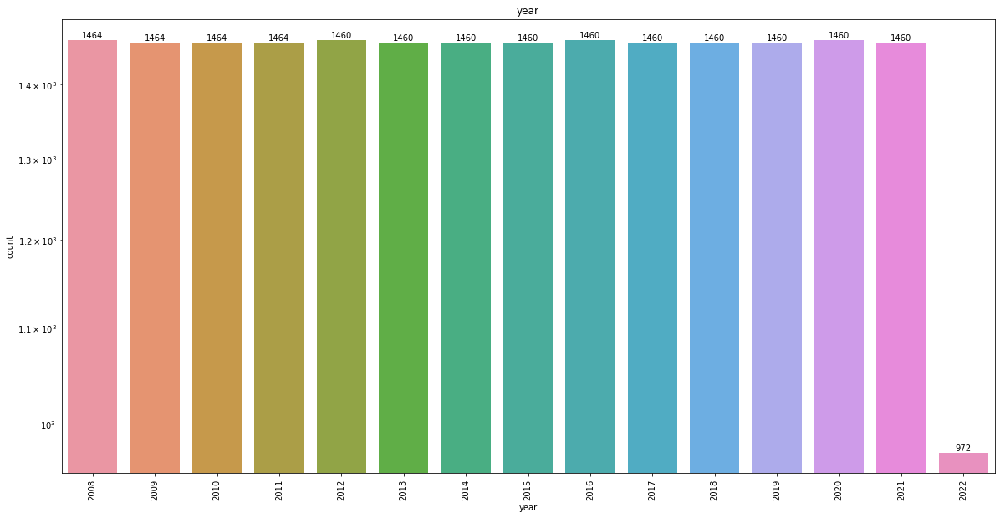

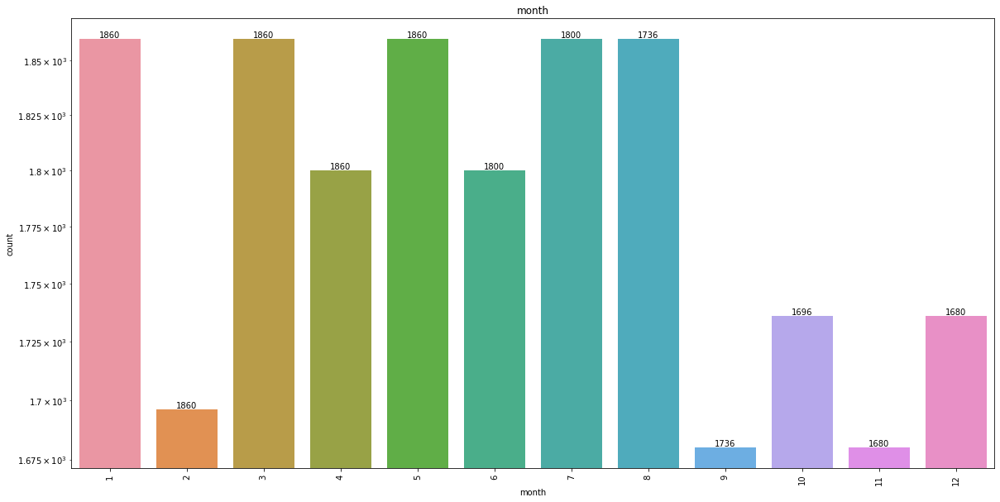

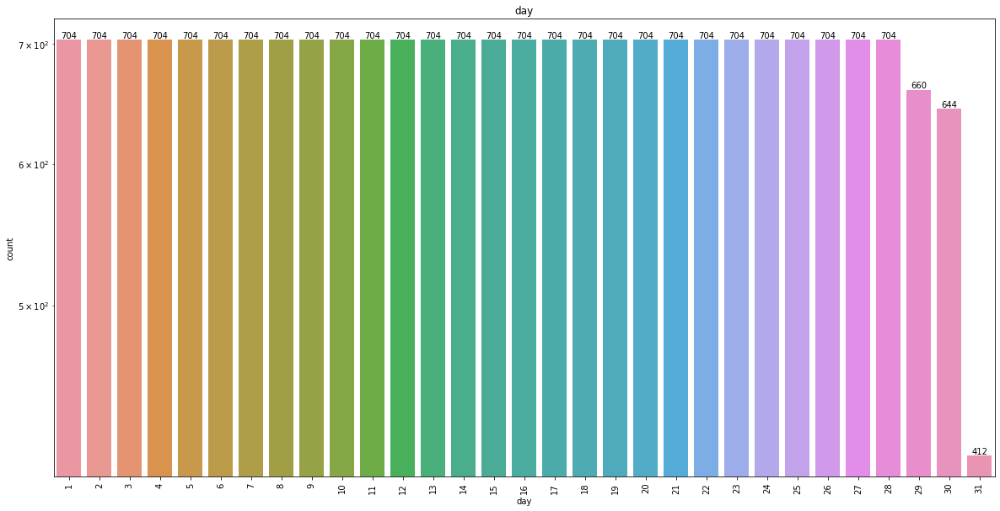

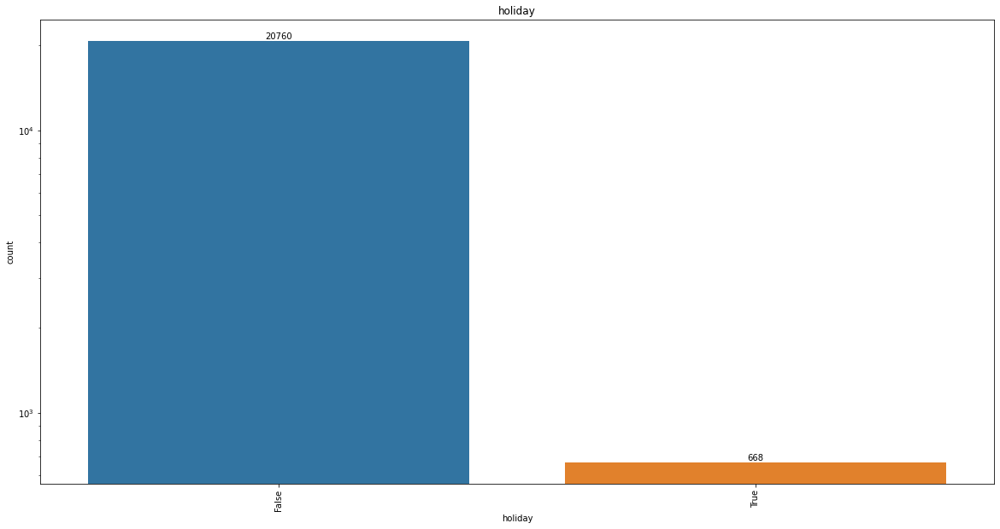

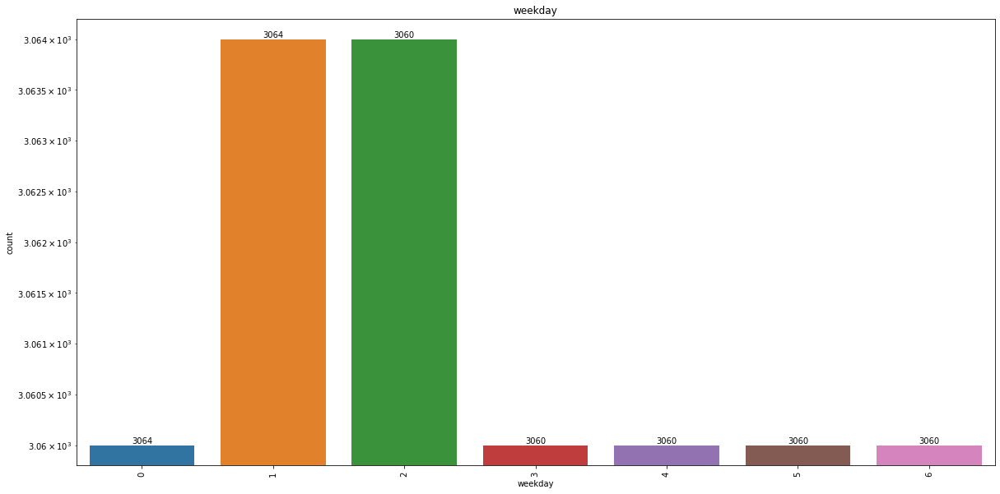

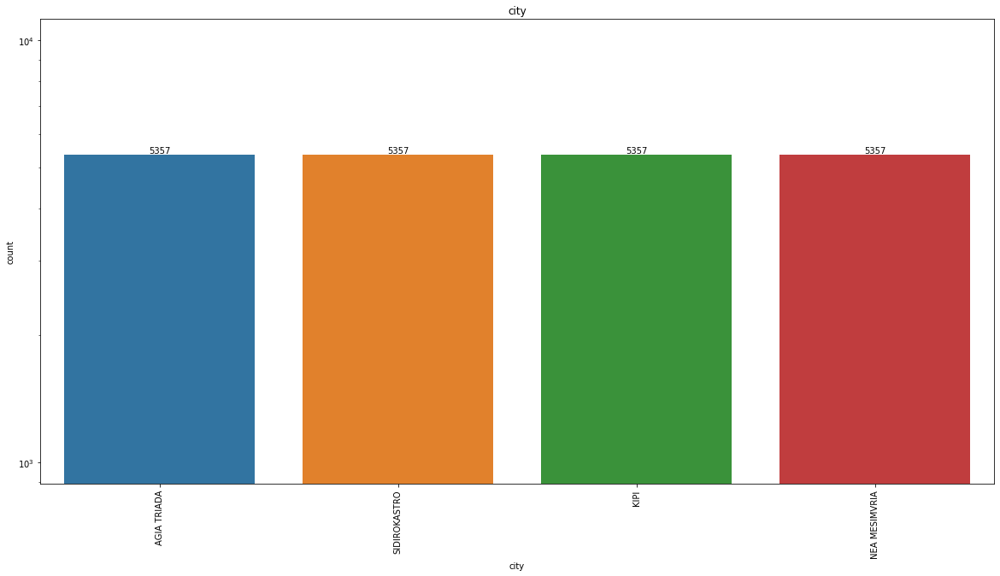

In [37]:
def create_barplots(pd):
    for col in ['year','month', 'day', 'holiday','weekday', 'city']:
        """
        This function creates a countplot for each of datetime_parameters we want in the x-axis
        Parameters: None
        ----------
        Returns: None
        -------
        """
        fig, ax = plt.subplots()
        fig.set_size_inches(20, 10)
        ax = sns.countplot(x=pd[col])
        ax.set_yscale('log')
        abs_values = pd[col].value_counts(ascending=False).values

        ax.bar_label(ax.containers[0], labels=abs_values,rotation=0)
        plt.title(col)
        plt.xticks(x=abs_values, rotation=90)
        plt.show()

create_barplots(income)

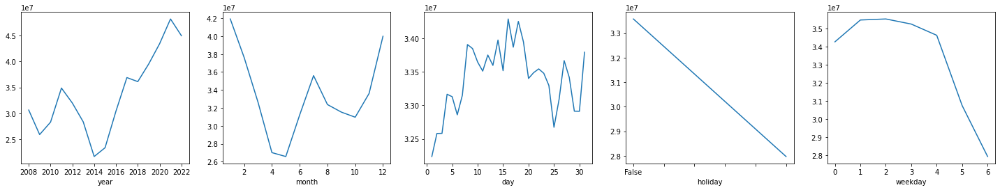

In [38]:
def load_meanplot(pd):
    """
    This function is used to plot the mean energy load per "datatime aspect" (year/month/hour etc)
    Parameters: 
            Dataframe for plotting
    ----------
    Returns: None
    -------
    """
    fig, axes = plt.subplots(1, 5)
    pd.groupby('year')['Kwh'].mean().plot(ax=axes[0], figsize=(25, 3))
    pd.groupby('month')['Kwh'].mean().plot(ax=axes[1], figsize=(25, 3))
    pd.groupby('day')['Kwh'].mean().plot(ax=axes[2], figsize=(25, 4))
    pd.groupby('holiday')['Kwh'].mean().plot(ax=axes[3], figsize=(25, 4))
    pd.groupby('weekday')['Kwh'].mean().plot(ax=axes[4], figsize=(25, 4))
load_meanplot(income)

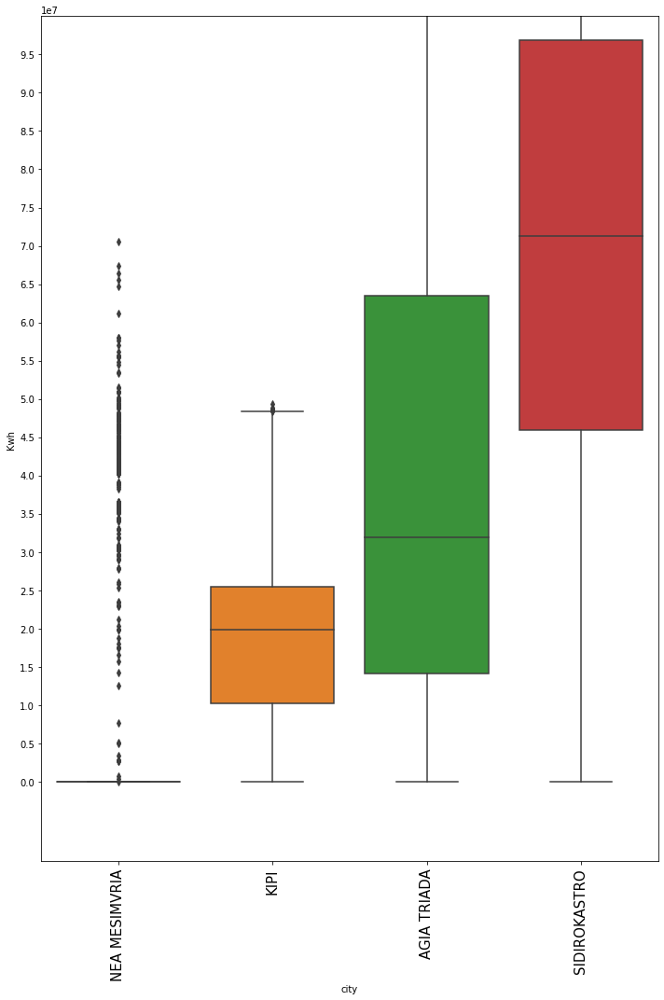

In [39]:
def create_boxplots(pd , neighbouring_countries=None,colour_list=None):
    """
    1.  Reads the initial dataframe df and copies 'load' and 'country' collumns (df_scaled)
    2.  Using df.describe() we get info about the load collumn grouped by countries (neighbouring_countries)
    3.  We sort that collumn based on mean value (given by desrcibe) and 
        make a list of the countries sorted by the mean of load collumn
    4.  then we sort our initial dataset based on the list in step 3 (neighbour_df)
    5.  Finally, we make side by side box plots of the distribution of load for each country 
        in our dataset
    Parameters: 
        neighbouring_countries: (optional) simple list of countries to plot side by side barplots
        colour_list: (optional) simple list of colours to colour neighbouring countries
        
    Returns: None
    -------
    """
    df_scaled = pd[['city', 'Kwh']].copy()
    
    if(neighbouring_countries is None):
        #group data by country and describe load data column
        neighbouring_countries = df_scaled.groupby('city')['Kwh'].describe()

        # sort above description by mean value and create the list of countries produced by that sorting
        neighbouring_countries = neighbouring_countries.sort_values(by=['mean']).index.get_level_values(0).to_list()

    # use the country column as index and sort dataset by the list of countries sorted by mean
    neighbour_df = df_scaled.set_index('city').loc[neighbouring_countries]

    neighbour_df.reset_index(inplace=True)
    fig, ax = plt.subplots()
    fig.set_size_inches(10, 15)
    if(colour_list is None):
        ax = sns.boxplot(x='city', y='Kwh', data=neighbour_df)
    else:
        ax = sns.boxplot(x='city', y='Kwh', data=neighbour_df,palette=colour_list)
        
    plt.xticks(fontsize=15, rotation=90)
    plt.yticks(range(0,100000000,5000000))
    plt.ylim(top=100000000) 
    plt.tight_layout()
    
create_boxplots(income)

In [40]:
def create_pivot_df(pd):
    """
    Reads the initial dataframe df and creates a pivot_table out of it
    Each row of the pivot table containts the mean (by default) value of 
    energy load at a specific datetime for all countries
    Each row is a different datetime, while each column is a different country
    Countries are sorted based on ascending mean value of energy load
    Parameters: None        
    Returns
    -------
    pandas.DataFrame
        The pivot table of the oriiginal dataframe as described above
    """
    # get description table (describe()) and group based on country for only "load" column
    neighbouring_countries = pd.groupby('city')['Kwh'].describe()

    # sort above description by mean value and create the list of countries produced by that sorting
    neighbouring_countries = neighbouring_countries.sort_values(by=['mean']).index.get_level_values(0).to_list()
    pivot_df = pd.pivot_table('Kwh', ['Date'], 'city')

    # sort columns based on ascending order of mean value per country (see boxplots above)
    pivot_df = pivot_df.reindex(columns=neighbouring_countries)
    print('NaN left in pivot table?: '+str(pivot_df.isnull().values.any()))
    return pivot_df

pivot_df = create_pivot_df(income)

NaN left in pivot table?: False


/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:681: RuntimeWarning: invalid value encountered in true_divide
  acf = avf[: nlags + 1] / avf[0]
/opt/conda/lib/python3.7/site-packages/matplotlib/axes/_base.py:2480: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


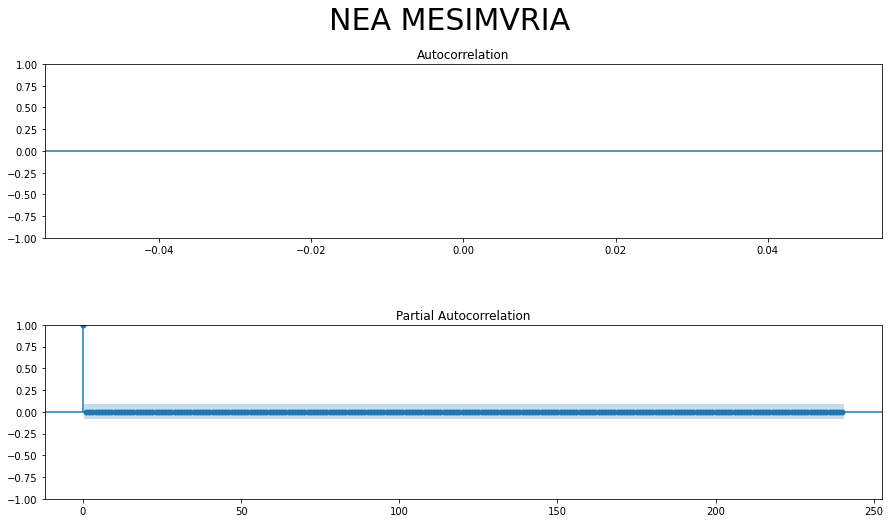

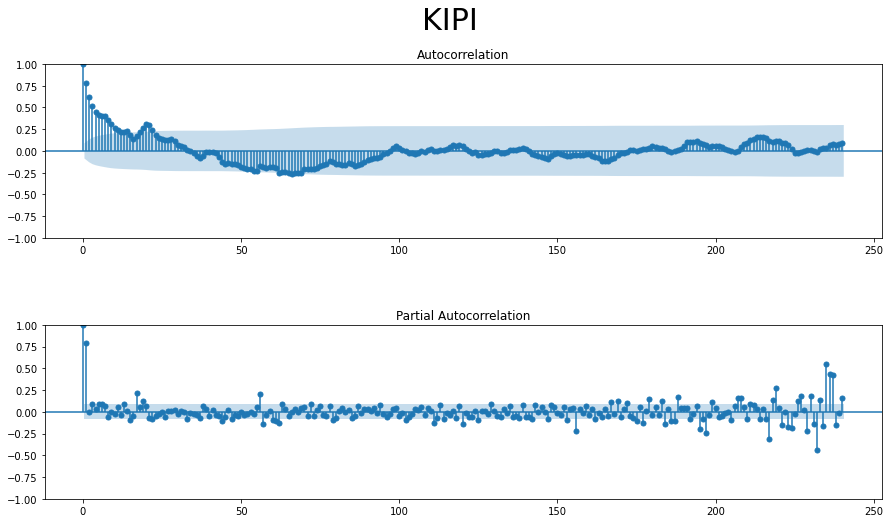

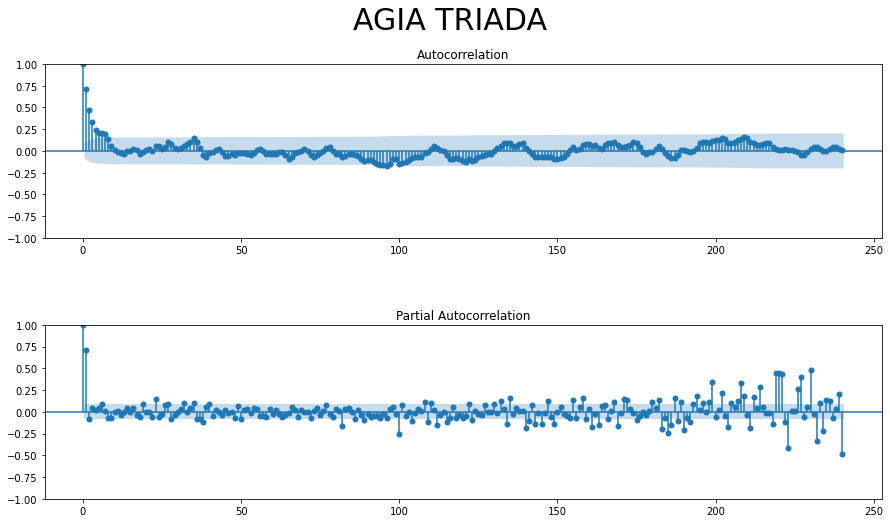

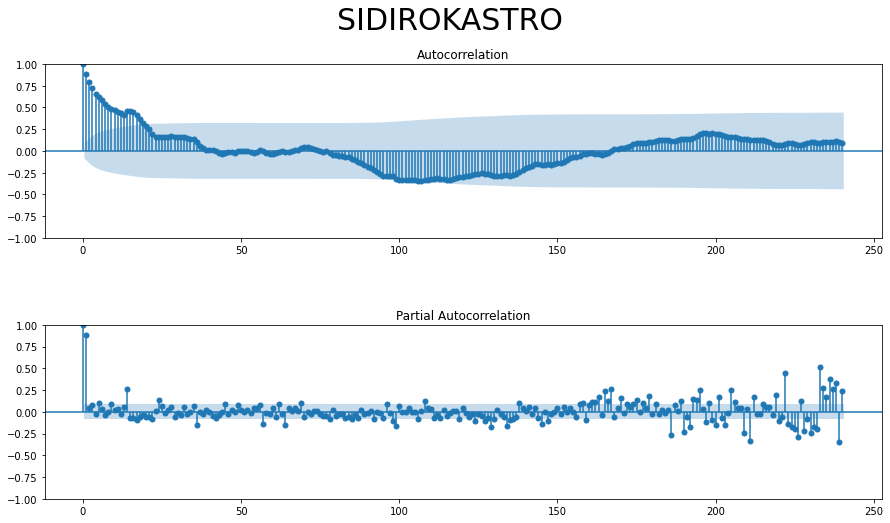

In [41]:
import statsmodels.api as sm

def plot_acf_pacf(dframe):
    """
    This function is used to plot acf/pacf plots for each country in our dataset
    Parameters: 
        dframe: pandas.dataframe (pivot table) where rows are data per country for one datetime        
    Returns: None
    -------
    """    
    # we need to remove NaN values since they can't be used for acf/pacf plots
    dframe_without_na = dframe.dropna()
    sample_size = 500 
    
    for city in dframe.columns:
        fig, ax = plt.subplots(2,1, figsize=(15, 8))
        fig.suptitle(city, fontsize=30)
        fig.subplots_adjust(hspace=0.5)
        
        """
        get a random value (idx) between 0 and lenth of current col 
        We subtract 'sample_size' so that rand_idx might not become a number that
        added with 'sample_size' can become more than length of current col 
        """
        rand_idx = np.random.randint(0,len(dframe_without_na[city].values)-sample_size)

        # get a contrinuous 'sample_size' values (sample) of dframe starting from said random idx
        dframe_sample = dframe_without_na.iloc[rand_idx : rand_idx+sample_size]
        
        # plot acf/pacf plots
        sm.graphics.tsa.plot_acf(dframe_sample[city], lags=24*10, ax=ax[0])    
        sm.graphics.tsa.plot_pacf(dframe_sample[city], lags=24*10, ax=ax[1], method='ols-adjusted')
        plt.show()
#         method must be one of: 'ols', 'ols-inefficient', 'ols-adjusted', 'yw', 'ywa', 'ld', 'ywadjusted', 'yw_adjusted', 'ywm', 'ywmle', 'yw_mle', 'lda', 'ldadjusted', 'ld_adjusted', 'ldb', 'ldbiased', 'ld_biased'
plot_acf_pacf(pivot_df)

In [42]:
# pivot_df.drop(labels=['KOSMIO'], axis=1, inplace=True)

In [65]:
import random
import string

def country_histograms(dframe,colourmap='tab20',country_list=None):
    """
    In this function, we create overlapping histograms where each histogram is 
    for a different country 
    Parameters: 
        dframe: pandas.dataframe for plotting histogram
        colourmap: string representing matplotlib set of colours for histogram
        country_list: (optional) list of countries to explicitely add to histogram
    ----------
    Returns: None
    -------
    """
    custom_lines = []
    countries = []
    pallete = []

    fig, ax = plt.subplots(figsize=(20,15))
    
    if country_list is not None:  # if used by other function
        # get columns that contain any country from the list 'weak_corr_countries'
        temp = dframe.drop(columns=[col for col in pivot_df 
                                      if col not in country_list])
    else: #if used independently
        # see code from previous cell for relative explanation of code
        temp = dframe
    
    ax.set(xlabel='Energy In', ylabel='Count')
    ax.set_title('Overlapping Histograms for each city',fontsize = 40)
    custom_fontsize = 10

    # ~~~~~~~~~~~~~~~~~~~~~ Colour based on cmap ~~~~~~~~~~~~~~~~~~~~~~~~~~
    # https://matplotlib.org/stable/tutorials/colors/colormaps.html    
    cmap_samples = mpl.cm.get_cmap(colourmap) 
    """
    colours change every 1/#colours (1/20 = 0.05), so for each value where there
    is new colour we add that colour, using cmap(), in a list and cycle through
    that list for every histogram we plot
    """
    for val in np.arange(0, 1, 0.05).tolist(): pallete.append(cmap_samples(val))
    pallete_cycler = cycle(pallete)
    
    for idx, col in enumerate(temp.columns):
        # ~~~~~~~~~~~~~~~~~~~ Randrom colour per hist ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
#         cur_colour = "#" + ''.join(random.choices("ABCDEF" + string.digits, k=6))

        # ~~~~~~~~~~ Colour based on max correlation of country ~~~~~~~~~~~~~~~~~
#         sorted_corr = dframe.corr().unstack().sort_values().drop_duplicates()
#         max_corr = sorted_corr[col][:].max()
#         cur_colour = cmap(max_corr)

        # ~~~~~~~~~~ Colour based on a mlp cmap ~~~~~~~~~~~~~~~~~
        cur_colour = next(pallete_cycler)

        sns.histplot(temp[col], ax=ax, kde=True, color=cur_colour)
        custom_lines.append(Line2D([0], [0], color=cur_colour, lw=4))
        countries.append(col)

    ax.legend(custom_lines, countries, fontsize=10)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)

In [66]:
def corr_heatmap(dframe,cluster_labels=None):
    """
    Creates correlation map of dframe between different countries 
    Parameters: 
        dframe: pandas.dataframe of our dataset
        cluster_labels: (optionally) list of labels from hierarchical clustering (see create_dendrogram() below)
    ----------
    Returns: None
    -------
    """
    # Compute the correlation matrix (excluding NA/null values)
    corr = dframe.corr()
    
    cmap = 'Spectral_r'
    # Generate a mask for the upper triangle
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(20, 15))

    # Draw the heatmap with the mask and correct aspect ratio
    res = sns.heatmap(corr, mask=mask, cmap=cmap, square=True, annot=True, 
                      annot_kws={"size": 10}, ax=ax)

    # size of country names
    res.set_xticklabels(res.get_xmajorticklabels(), fontsize = 10, rotation = 90)
    res.set_yticklabels(res.get_ymajorticklabels(), fontsize = 10, rotation = 0); # ";" to supress print in cell

    # change font size of heatmap colourbar
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=20)
    ax.set_title('Country Correlation Heatmap',fontsize = 40)

#     weak_corr_countries = ['NEA MESIMVRIA','KIPI','AIA TRIADA','SIDIROKASTRO']
    
    # create histogram for countries 
    if cluster_labels is not None:
        for cluster, countries in cluster_labels.items():
            country_histograms(dframe,cmap,countries)
    else:
        pass
#         country_histograms(dframe,cmap,weak_corr_countries)

In [67]:
def corr_heatmap(dframe,cluster_labels=None):
    """
    Creates correlation map of dframe between different countries 
    Parameters: 
        dframe: pandas.dataframe of our dataset
        cluster_labels: (optionally) list of labels from hierarchical clustering (see create_dendrogram() below)
    ----------
    Returns: None
    -------
    """
    # Compute the correlation matrix (excluding NA/null values)
    corr = dframe.corr()
    
    cmap = 'Spectral_r'
    # Generate a mask for the upper triangle
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(20, 15))

    # Draw the heatmap with the mask and correct aspect ratio
    res = sns.heatmap(corr, mask=mask, cmap=cmap, square=True, annot=True, 
                      annot_kws={"size": 10}, ax=ax)

    # size of country names
    res.set_xticklabels(res.get_xmajorticklabels(), fontsize = 10, rotation = 90)
    res.set_yticklabels(res.get_ymajorticklabels(), fontsize = 10, rotation = 0); # ";" to supress print in cell

    # change font size of heatmap colourbar
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=20)
    ax.set_title('Country Correlation Heatmap',fontsize = 40)

#     weak_corr_countries = ['NEA MESIMVRIA','KIPI','AIA TRIADA','SIDIROKASTRO']
    
    # create histogram for countries 
    if cluster_labels is not None:
        for cluster, countries in cluster_labels.items():
            country_histograms(dframe,cmap,countries)
    else:
        pass
#         country_histograms(dframe,cmap,weak_corr_countries)

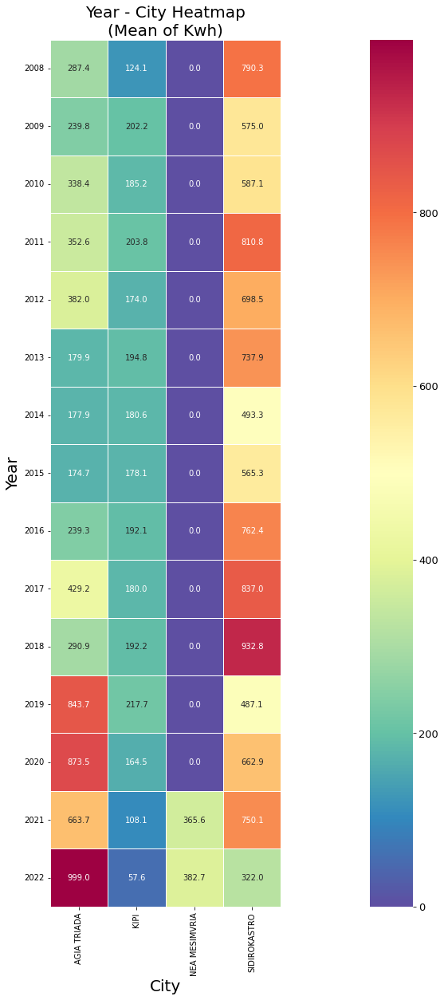

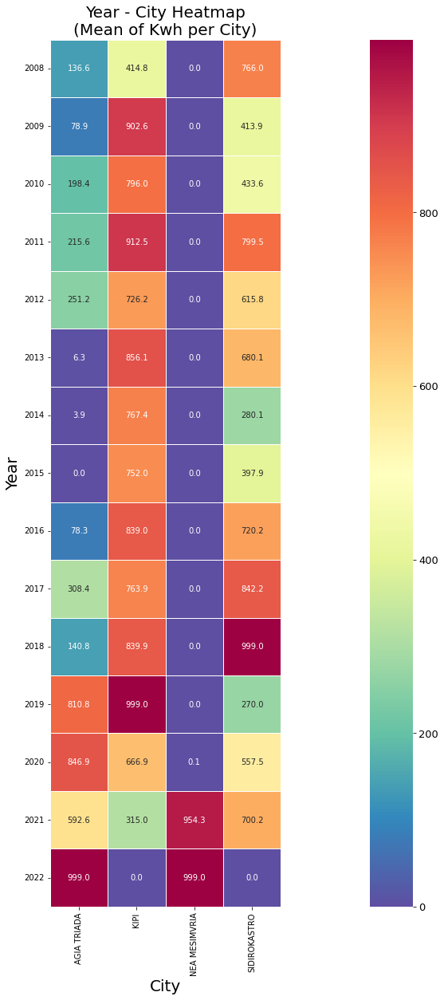

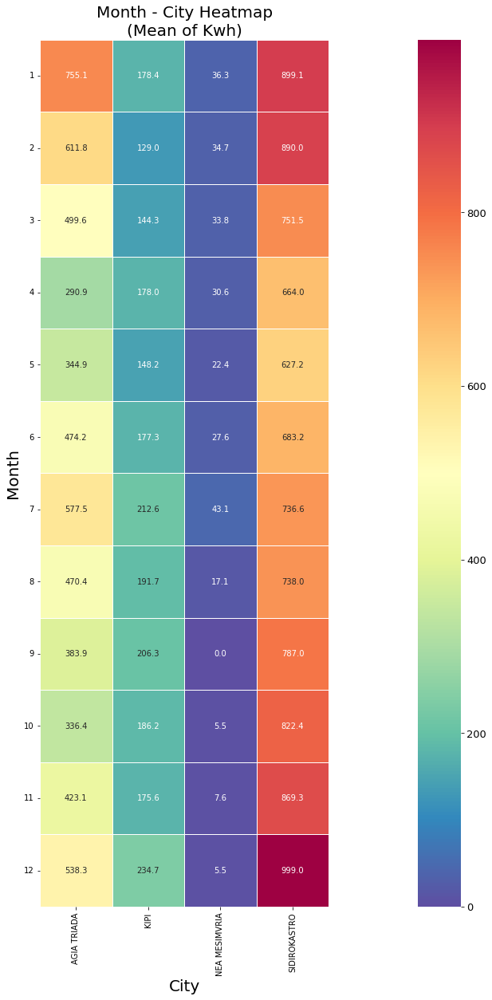

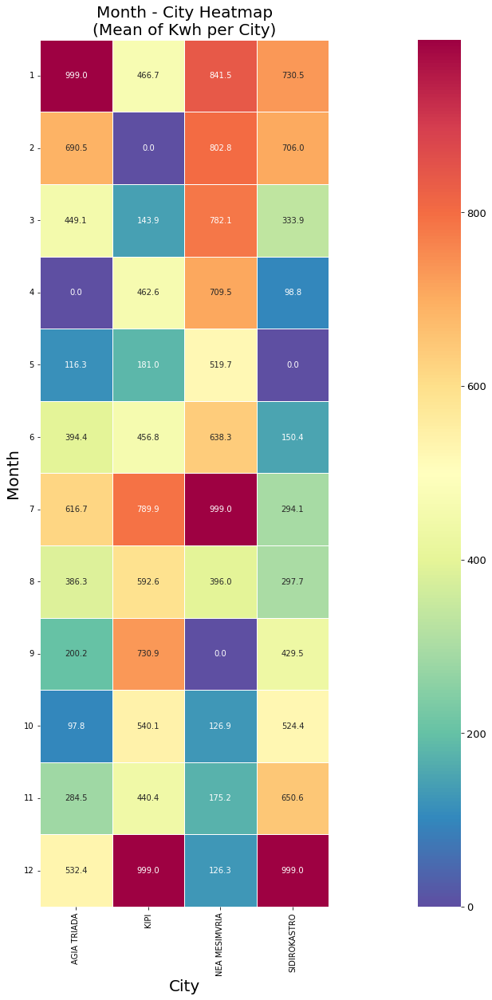

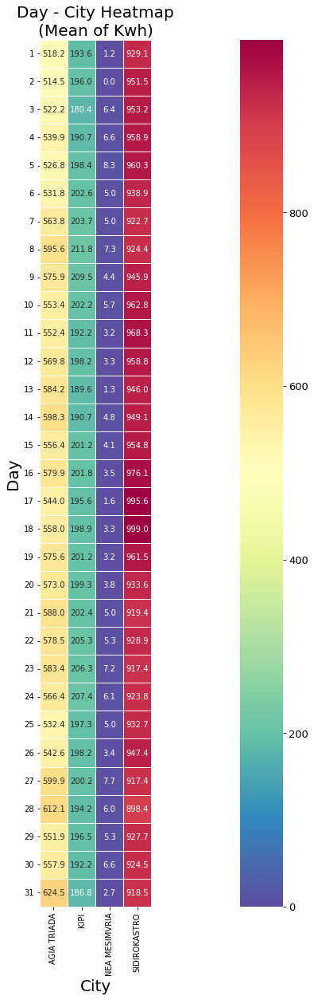

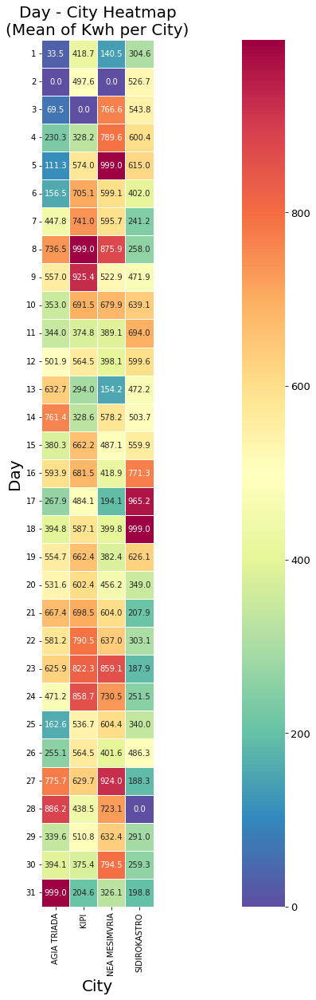

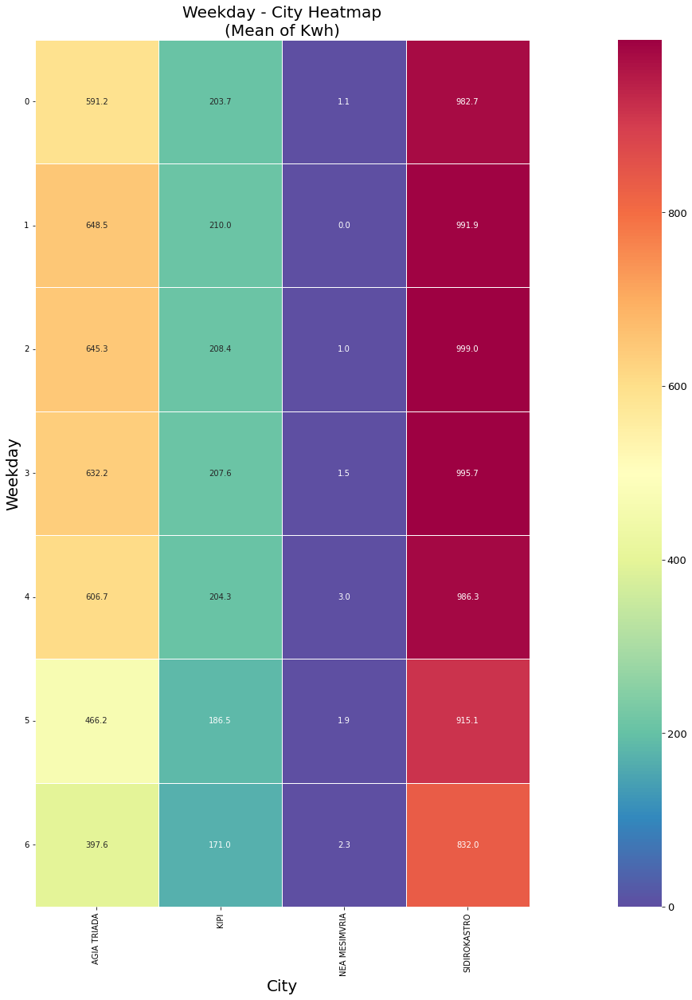

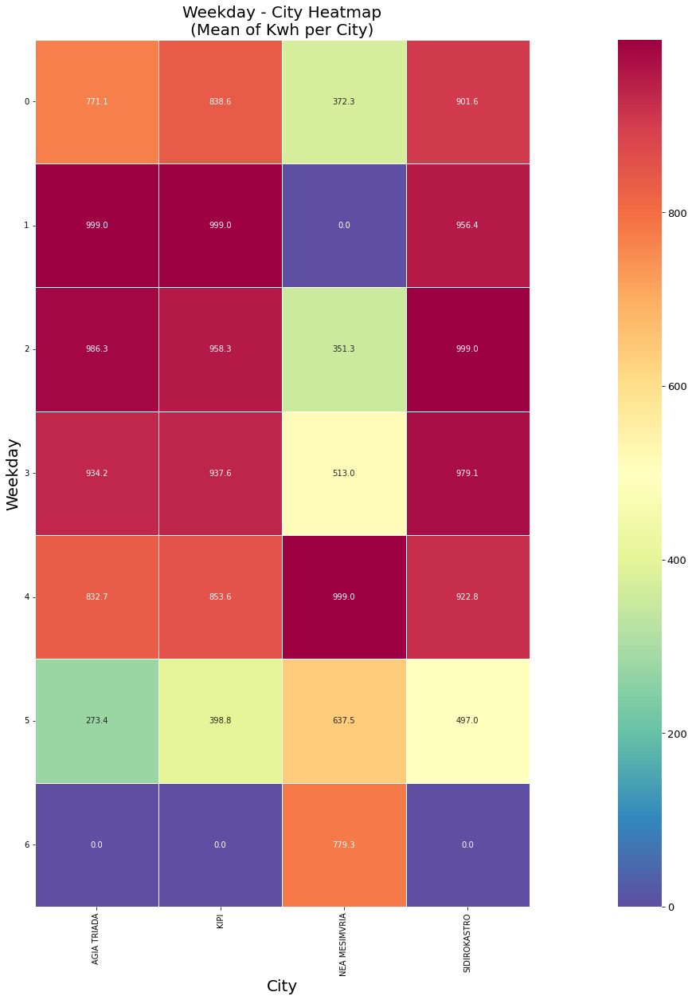

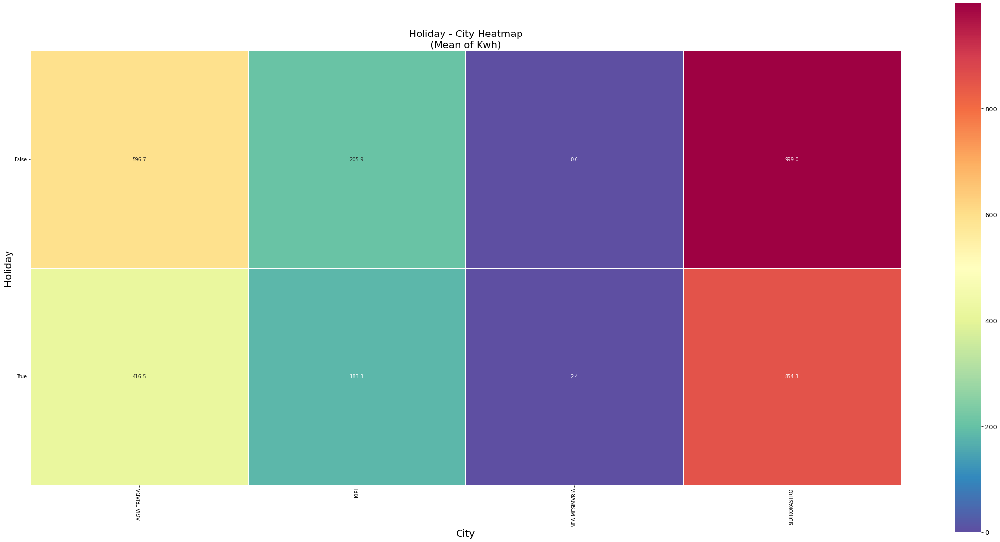

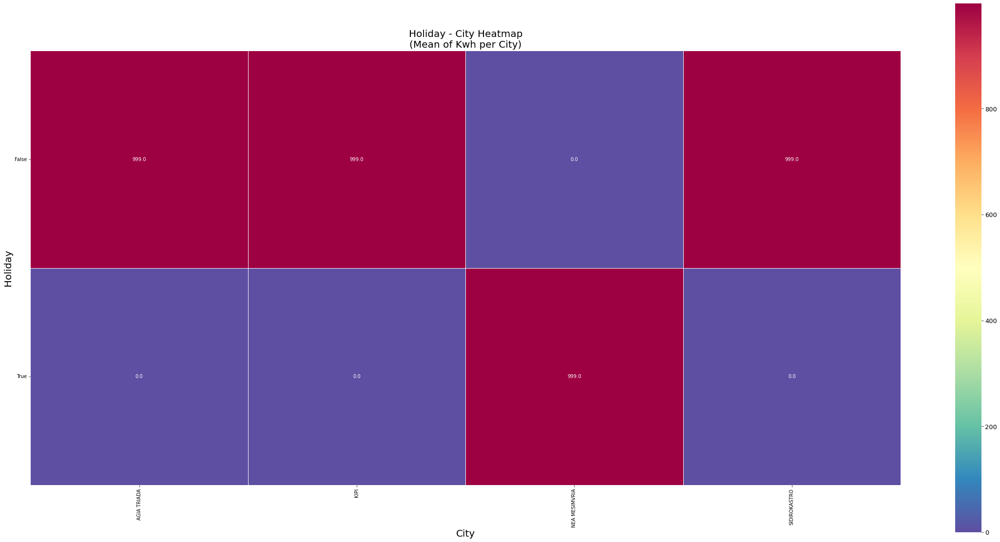

In [68]:
def plot_hmap(dframe, col, annot_size, aggfunc, plot_title):
    """
    This function jus creates the heatmaps of dataframes formed in date_heatmap()
    Parameters: 
        dframe: Pandas.dataframe containing dataframe for heatmap
        col: string which is the name of dframe column and what y-axis of heatmap is going to represent 
        annot_size: size of text inside cells of heatmap
        aggfunc: string containing aggregration function used (title of plot)
    ----------
    Returns: None
    -------
    """
    f, ax = plt.subplots(figsize=(40, 20))
    plt.title(plot_title, fontsize=annot_size+10)

    # Draw the heatmap with the mask and correct aspect ratio
    res = sns.heatmap(dframe, cmap='Spectral_r', square=True, annot=True, 
                      fmt='.1f', annot_kws={"size": annot_size}, ax=ax, linewidths=.9)

    # size of country names
    res.set_xticklabels(res.get_xmajorticklabels(), fontsize = annot_size, rotation = 90)
    res.set_yticklabels(res.get_ymajorticklabels(), fontsize = annot_size, rotation = 0); # ";" to supress print in cell

    #change size of axis labels
    ax.set_xlabel('City', fontsize = annot_size+10)
    ax.set_ylabel(col.title(), fontsize = annot_size+10)

    # change font size of heatmap colourbar        
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=annot_size+3)
    
    
def date_heatmap():
    """
    Creates a heatmap where for each country and for some datetime aspects (see values in col paramter)
    displays the sum/mean of energy load for that given col based dataframe,scaled between 0 and 100
    based on min/max values of matrix
    Parameters: None
    ----------
    Returns: None
    -------
    """
    # define our scaling function with custom min/max possible values that x might have 
    scale_func = lambda x: (((x - min) / (max - min))*999)
    
    aggfunc = 'mean' # values: mean/sum/count/max/min
    
    for col in ['year', 'month','day','weekday','holiday']:
        # create pivot table with index a given column
        pivot = income.pivot_table('Kwh', [col], 'city', aggfunc=aggfunc)
        
        """
         Use lambda function above to perform minmax scaling column-wise
         We want out min/max values to be for the whole pivot_table, so sklearn.MinMaxScaler was avoided
         This can be explained by its min()/max() methods which, for a pivot_table, return
         the min/max per column and not of pivot_table (setting of custom methods was in order)
        """
        # find min/max value out of min/max values of all countries (columns)         
        min = pivot.min().min()
        max = pivot.max().max()              
        totalscaled_pivot = pivot.copy()
        totalscaled_pivot[pivot.columns] = scale_func(pivot[pivot.columns]).round(2) #round to two (2) decimals   
        
        countryscaled_pivot = pivot.copy()
        scaler = MinMaxScaler(feature_range=(0, 999)) # scale in specific range
        countryscaled_pivot[pivot.columns] = scaler.fit_transform(pivot[pivot.columns]).round(2)         

        if col=='yearweek': annot_size = 15
        else: annot_size = 10

        # ~~~~~~~~~~~~~~~~~~~~~~~~~~ Plot heatmaps ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~    
        
        plot_title = col.title()+' - City Heatmap\n({} of Kwh)'.format(aggfunc.title())
        plot_hmap(totalscaled_pivot, col, annot_size, aggfunc, plot_title)   # Heatmap normalized by all values
        
        plot_title = col.title()+' - City Heatmap\n({} of Kwh per City)'.format(aggfunc.title())
        plot_hmap(countryscaled_pivot, col, annot_size, aggfunc, plot_title) # Heatmap normalized by country
        
date_heatmap()

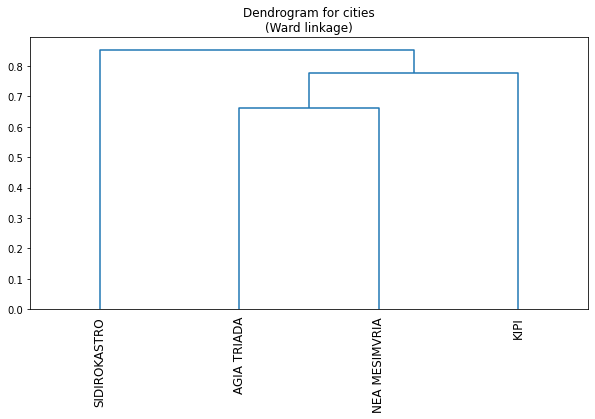

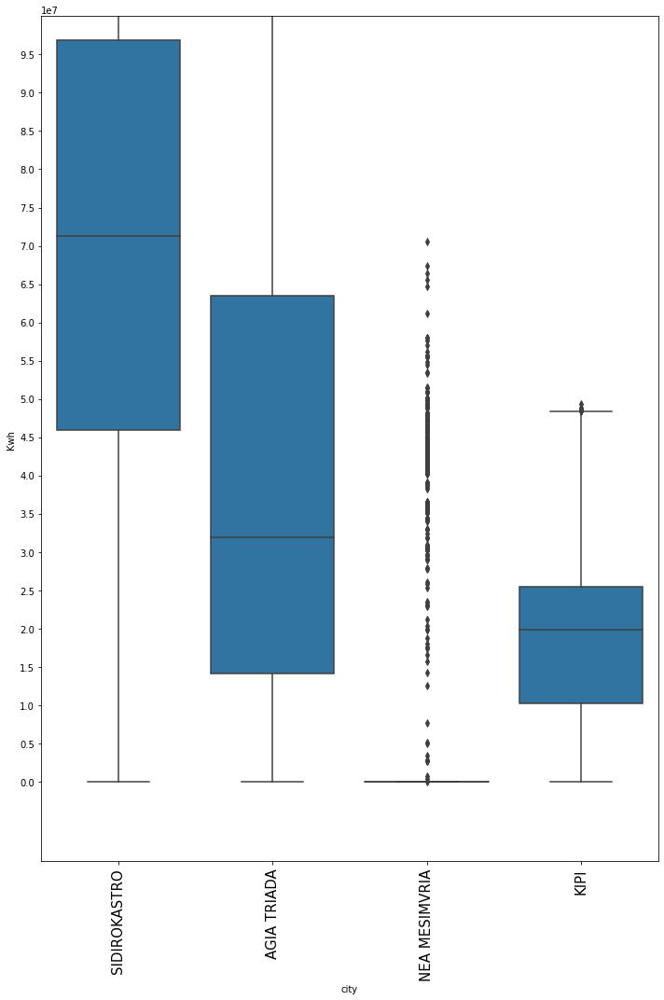

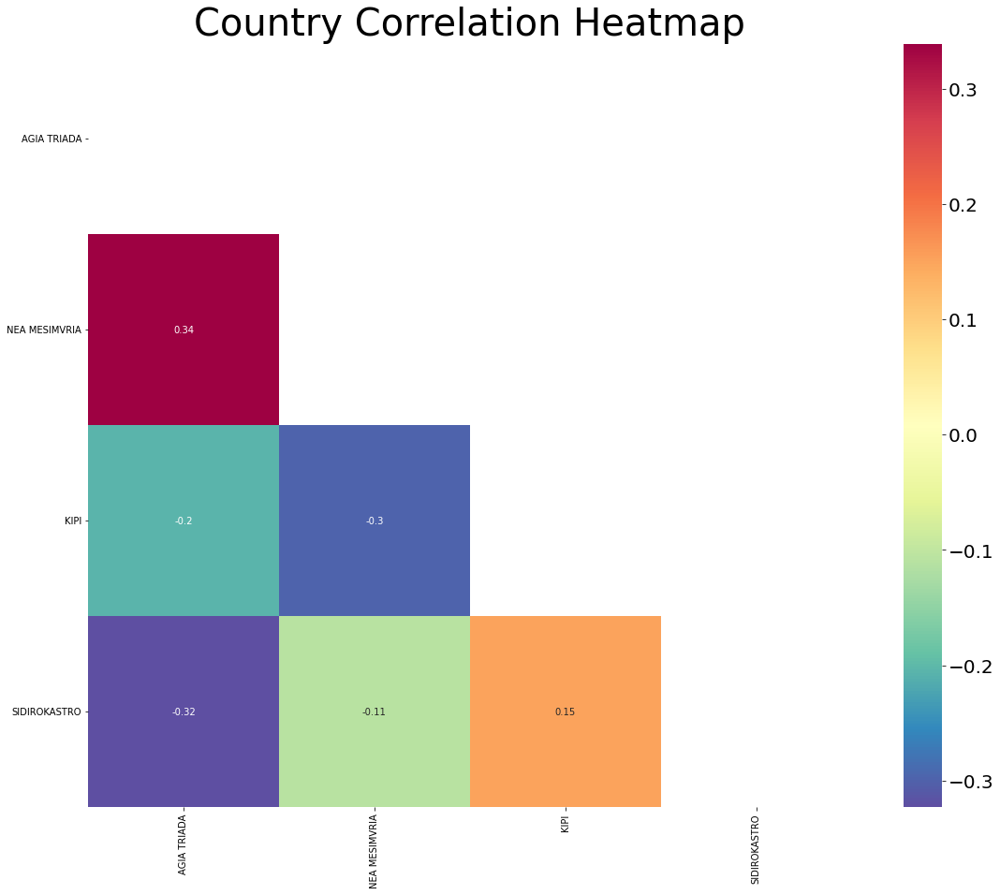

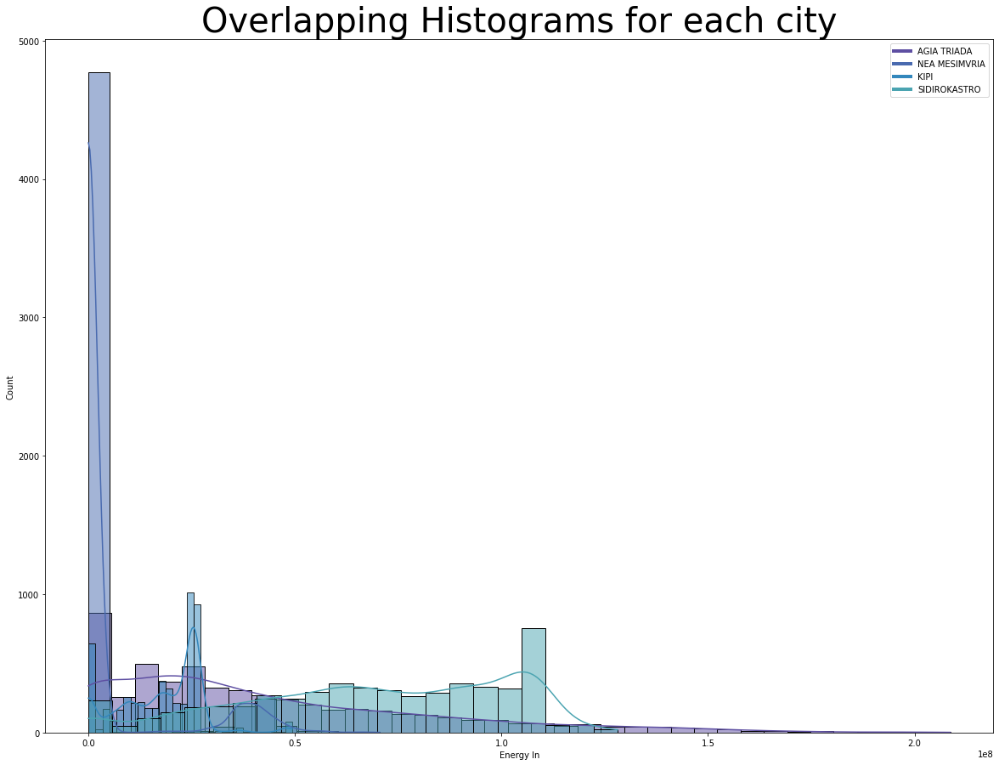

In [69]:
# https://www.kaggle.com/code/sgalella/correlation-heatmaps-with-hierarchical-clustering
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import squareform
from collections import defaultdict

def clusterize_corr(Z,dframe):
    '''
    This function is used by dendrogram to create the dataframe where countries
    with greater correlation are grouped together to be later displayed by the heatmap
    Parameters: 
        Z: ndarray and linkage() return value 
        cluster_labels: pandas.dataframe used for clustering
    ----------
    Returns: 
        Dataframe where labels are sorted based on clustering of dendrogram 
    -------
    '''
    # Clusterize the data
    threshold = 0.05
    labels = fcluster(Z, threshold, criterion='distance')
    
    # Keep the indices to sort labels
    labels_order = np.argsort(labels)
    
    pivot = dframe.copy() #create copy of dframe to avoid permanent changes
    
    # Build a new dataframe with the sorted columns
    for idx, i in enumerate(pivot.columns[labels_order]):
        if idx == 0:
            clustered = pd.DataFrame(pivot[i])
        else:
            df_to_append = pd.DataFrame(pivot[i])
            clustered = pd.concat([clustered, df_to_append], axis=1)
    
    return clustered

def group_dendrolabels(dendro):
    '''
    Creates list of list, where each internal list is a cluster with its countries    
    
    The apperant pattern is that legs positioned at leaves will end with 5. 
    The reason is to nicely place the leg at the middle of the corresponding leaf index value. 
    This also implies the actual list indices of the leaf are multiplied by 10.
    Thus we first subtract 5 from each colors icoord, then divide by 10. 
    If the resulting number is close to the closest integer, 
        we consider this to be an index for a leaf and add its labe to the dict
    If not, then the colored tree we got it from is from non-leaf parts of the trees.
    Parameters: 
            dendro: dict and return value of dendrogram
    ----------
    Returns: 
        list of labels based on clustering of dendrogram 
    -------    
    '''
#     print(dendro['ivl'])
#     print(dendro['icoord'])
    cluster_labels = defaultdict(list)

    for colours, icoords in zip(dendro['color_list'], dendro['icoord']):
        for leg in icoords[1:3]:
            num = (leg - 5.0) / 10.0
            if abs(num - int(num)) < 1e-5:
                cluster_labels[colours].append(dendro['ivl'][int(num)])
    
    return cluster_labels
    
def create_dendrogram(dframe):
    
    
    dframe.replace(np.nan, 0.0,inplace=True)

    
    
    '''
    Dendrogram() uses the linkage matrix (encoding the hierarchical clustering) to render as a dendrogram
    
    The scipy.cluster.hierarchy.linkage function accepts either a: 
        1-D condensed distance matrix or 
        2-D array of observation vectors
    Therefore i use scipy.spatial.distance.squareform to convert my 2-D distance matrix (corr)
    into a 1-D condensed one
        Parameters: 
            pandas.dataframe for creating dendrogram based on correlation
    ----------
    Returns: None
    -------
    '''
    corr = dframe.corr()
    
    """
    - squareform requires distance (dissimilarity) matrix 
    - If the correlation² between two random variables is r,
      then their correlation distance is defined as d = 1-r.
      (https://medium.com/swlh/is-correlation-distance-a-metric-5a383973978f)
    """
    dissimilarity = 1 - abs(corr)
    sqform = squareform(dissimilarity)

    plt.figure(figsize=(10,5))
    plt.title("Dendrogram for cities\n(Ward linkage)")    
    
    # Perform hierarchical/agglomerative clustering.
    Z = linkage(sqform, 'ward', optimal_ordering=True) 
    
    # create dendrogram     
    dendro = dendrogram(Z, labels=dframe.columns,color_threshold=0.5,
                        orientation='top', leaf_rotation=90);
    plt.show()
    
    clustered = clusterize_corr(Z,dframe)
   
    cluster_labels = group_dendrolabels(dendro)

    create_boxplots(income,dendro['ivl'],dendro['leaves_color_list'])    
    corr_heatmap(clustered,cluster_labels)    
#     create_choropleth(dendro['ivl'],dendro['leaves_color_list'])
    
create_dendrogram(pivot_df)

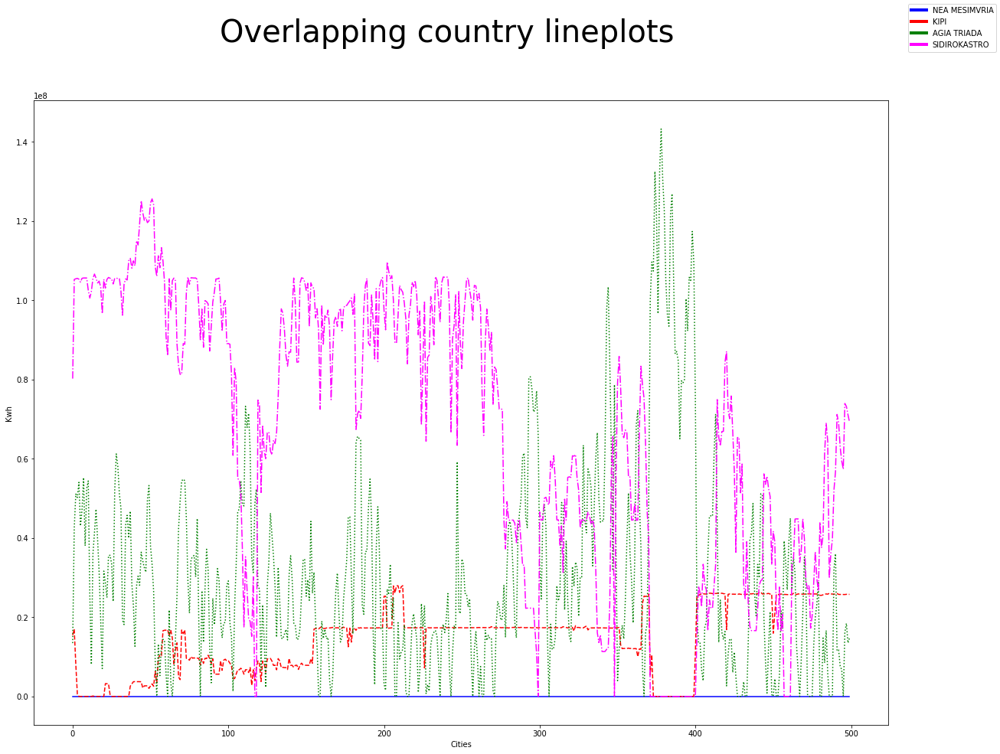

In [70]:
ls = ['-','--',':','-.','-','--',':','-.']
linecycler = cycle(ls) #create an object that can circle around that list

fig, ax = plt.subplots(figsize=(20,15))
fig.suptitle('Overlapping country lineplots', fontsize=40)
fig.subplots_adjust(hspace=0.5) # create space between vertical plots (by axes)

custom_lines = []
country_list = []
colours = ['blue','red','green','magenta','yellow',
           'black','brown','orange','pink','olive',
           'purple','crimson','gold'] # list of colours for plots
colour_iter = iter(colours) #iterator for list of colours

pivot = pivot_df.reset_index()
pivot[pivot['Date'].dt.year == 2019]
dframe_without_na = pivot.dropna()

rand_idx = 500 # 500/24 = 20 days approximately

for country in ['NEA MESIMVRIA','KIPI','AGIA TRIADA','SIDIROKASTRO']:
    cur_colour = next(colour_iter) 
    cur_linestyle = next(linecycler)
    
    # get a contrinuous 'sample_size' values (sample) of dframe starting from said random idx
    dframe_sample = dframe_without_na.iloc[0 : rand_idx]

    sns.lineplot(data=dframe_sample[country], color=cur_colour, ax=ax, linestyle=cur_linestyle)
    ax.set(xlabel='Cities', ylabel='Kwh')

    # add lines and labels for legend based on those used for lineplot above
    custom_lines.append(Line2D([0], [0], color=cur_colour, lw=4))
    country_list.append(country)

fig.legend(custom_lines, country_list);

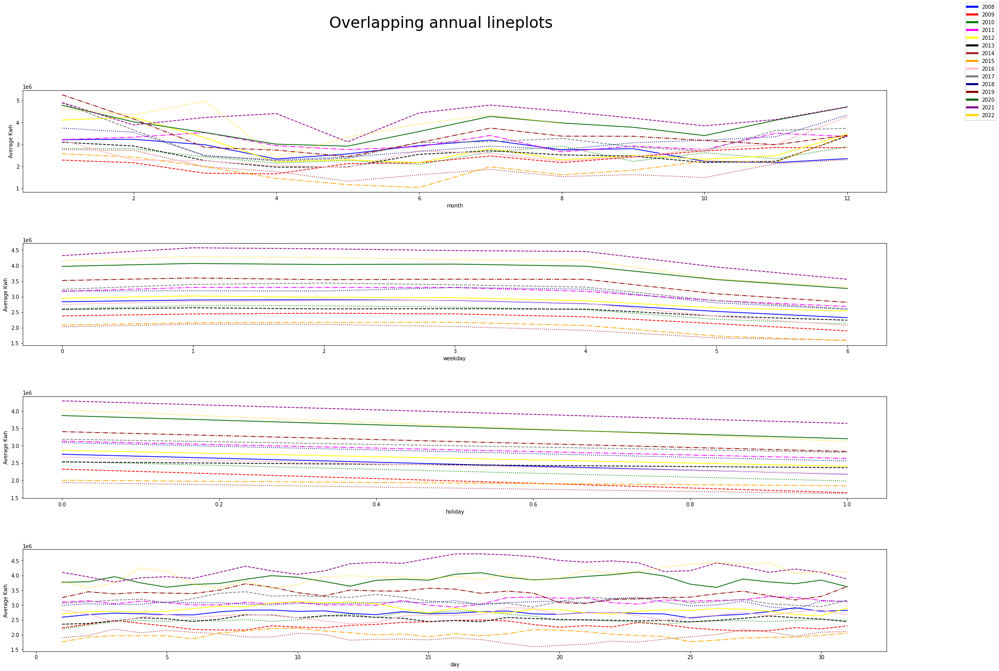

In [71]:
def annual_lineplots():
    """
    Above we plot lines where each line is a different year to demonstrate how values shift 
    on average every year based on yearweek/weekday/hour.
    In the x-axis, we display the datetime (52/6/24 values for yearkweeks/weekdays/hours per year respectively). 
    In the y-axis, it is the average value of a given x-axis for that year
    Parameters: None
    ----------
    Returns: None
    -------
    """
    # make a list out of possible linestyle we want our line plots to have
    ls = ['-','--',':','-.','-','--',':','-.']
    linecycler = cycle(ls) #create an object that can circle around that list

    fig, ax = plt.subplots(4, 1, figsize=(30,20))
    fig.suptitle('Overlapping annual lineplots', fontsize=30)
    fig.subplots_adjust(hspace=0.5) # create space between vertical plots (by axes)

    custom_lines = []
    years = []
    colours = ['blue','red','green','magenta','yellow','black','brown','orange','pink',"grey",'darkblue','darkred','darkgreen','darkmagenta','gold',] # list of colours for plots
    colour_iter = iter(colours) #iterator for list of colours
    
    
    #for each unique year in our dataset (2015-2022)
    for year in outcome['year'].unique():
    #     cur_colour = "#" + ''.join(random.choices("ABCDEF" + string.digits, k=6))
        #get a new colour and linestyle to plot
        cur_colour = next(colour_iter) 
        cur_linestyle = next(linecycler)
        
        # for each datetime_parameter we want our x-axis to be
        for axes,datetime_cov in enumerate(['month', 'weekday', 'holiday', 'day']):
            # find the mean value of energy load for each datetime_parameter for a given year based 
            temp = outcome[outcome['year']==year].groupby(datetime_cov)['Kwh'].mean()
            sns.lineplot(data=temp, color=cur_colour, ax=ax[axes], linestyle=cur_linestyle)
            ax[axes].set(xlabel=datetime_cov, ylabel='Average Kwh')
        
        # add lines and labels for legend based on those used for lineplot above
        custom_lines.append(Line2D([0], [0], color=cur_colour, lw=4))
        years.append(year)
    
    fig.legend(custom_lines, years)

annual_lineplots()

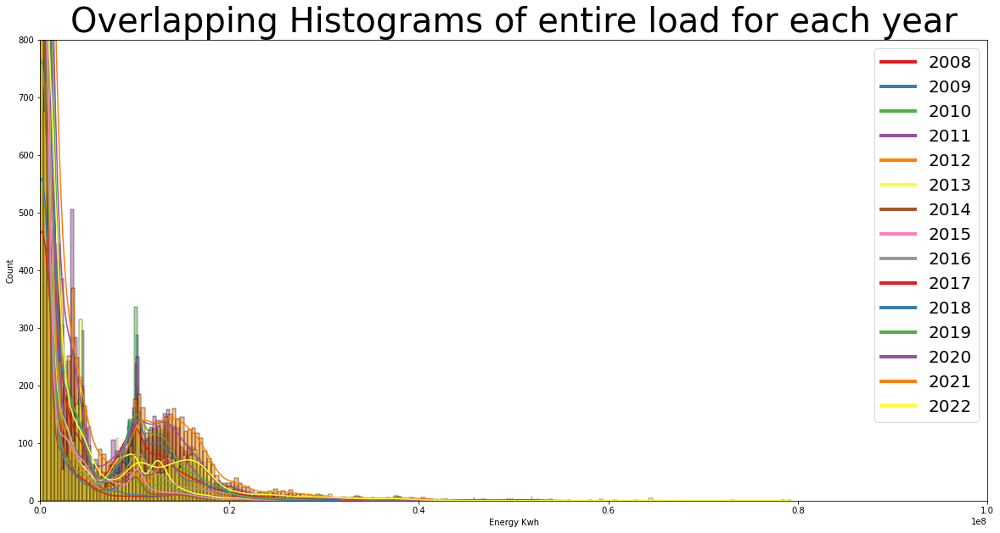

In [72]:
def year_histograms():
    """
    In this function, we create overlapping histograms where each histogram is 
    the entirety of our dataset (all countries) for a different year 
    Parameters: None
    ----------
    Returns: None
    -------
    """
    # see code from previous cell for relative explanation of code
    custom_lines = []
    years = []
    pallete = []
    # ~~~~~~~~~~~~~~~~~~~~~ Colour based on cmap ~~~~~~~~~~~~~~~~~~~~~~~~~~
    cmap = mpl.cm.get_cmap('Set1')    
    for val in np.arange(0, 1, 0.12).tolist(): pallete.append(cmap(val))
    pallete_cycler = cycle(pallete)
    # ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
    
    fig, ax = plt.subplots(figsize=(20,10))
    ax.set(xlabel='Energy Kwh', ylabel='Count')
    plt.title('Overlapping Histograms of entire load for each year', fontsize=40)
    plt.xlim(0, 100000000);
    plt.ylim(0, 800);

    for year in outcome['year'].unique():
        temp = outcome[outcome['year']==year]
    #     cur_colour = "#" + ''.join(random.choices("ABCDEF" + string.digits, k=6))
        cur_colour = next(pallete_cycler)
        sns.histplot(temp['Kwh'], ax=ax, kde=True, color=cur_colour)
        custom_lines.append(Line2D([0], [0], color=cur_colour, lw=4))
        years.append(year)
    
    ax.legend(custom_lines, years,fontsize=20);
    
year_histograms()

In [73]:
from pandas_profiling import ProfileReport

def create_profile_report(): return ProfileReport(outcome)

pivot_report = create_profile_report()
pivot_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]